# Traitement de données

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Chargement des modules

In [ ]:
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
import re

# BDD Data Climatique

In [ ]:
bdd_clim = pd.read_csv("/content/drive/MyDrive/Projet Data/DataClimatiques.csv")

bdd_clim

,NUM_POSTE,NOM_USUEL,LAT,LON,ALTI,AAAAMM,RR,QRR,NBRR,RR_ME,...,NEIGETOTAB,QNEIGETOTAB,NEIGETOTABDAT,NBJNEIGETOT1,NBJNEIGETOT10,NBJNEIGETOT30,NBJGREL,NBJORAG,NBJBROU,DEP
0,1014002,ARBENT,46.278167,5.669000,534,202301,112.8,1.0,31.0,NaN,...,12.0,9.0,19.0,15.0,2.0,0.0,NaN,NaN,NaN,1
1,1014002,ARBENT,46.278167,5.669000,534,202302,19.4,1.0,28.0,NaN,...,0.0,9.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,1
2,1014002,ARBENT,46.278167,5.669000,534,202303,134.4,1.0,31.0,NaN,...,1.0,9.0,3.0,2.0,0.0,0.0,NaN,NaN,NaN,1
3,1014002,ARBENT,46.278167,5.669000,534,202304,113.6,1.0,30.0,NaN,...,0.0,9.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,1
4,1014002,ARBENT,46.278167,5.669000,534,202305,54.4,1.0,31.0,NaN,...,1.0,9.0,31.0,2.0,0.0,0.0,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28157,98833002,MEA,-21.455500,165.767333,571,202308,242.8,1.0,31.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,988
28158,98833002,MEA,-21.455500,165.767333,571,202309,261.7,1.0,30.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,988
28159,98833002,MEA,-21.455500,165.767333,571,202310,187.4,1.0,31.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,988
28160,98833002,MEA,-21.455500,165.767333,571,202311,17.8,1.0,30.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,988


## Analyse structurelle

In [ ]:
# Création d'une copie indépendante de bdd_clim pour pouvoir la modifier sans altérer l’original
base_clim = bdd_clim.copy()

In [ ]:
# Compréhension du type de données des 163 variables
base_clim.dtypes

,0
NUM_POSTE,int64
NOM_USUEL,object
LAT,float64
LON,float64
ALTI,int64
...,...
NBJNEIGETOT30,float64
NBJGREL,float64
NBJORAG,float64
NBJBROU,float64


In [ ]:
# Affichage des dimensions de la base
print("Dimensions :", base_clim.shape)

Dimensions : (28162, 163)


In [ ]:
# Compter les doublons complets (lignes identiques)
n_duplicates = base_clim.duplicated().sum()
print(f"Nombre de doublons : {n_duplicates}")

Nombre de doublons : 0


In [ ]:
# Nombre de doublons purs/parfaits
sum(base_clim.duplicated())

0

## Qualité des données : nettoyage

In [ ]:
# Création d'une vraie date à partir de AAAAMM
base_clim["date"] = pd.to_datetime(base_clim["AAAAMM"].astype(str), format="%Y%m")

# Pourquoi ? "AAAAMM" est un format numérique représentant l'année et le mois.
# Le convertir en objet date facilite l'analyse temporelle : graphiques, filtrage par année/mois, etc.

In [ ]:
# Total de valeurs manquantes par colonne
missing_per_col = base_clim.isna().sum()

# Pourcentage de valeurs manquantes
missing_percent = (base_clim.isna().sum() / len(base_clim)) * 100
missing_percent = missing_percent.sort_values(ascending=False)

# Afficher les 10 colonnes les plus concernées
print(missing_percent.head(40))


DIFT             100.000000
QDIFT            100.000000
DXI3SAB           99.925431
QDIRT             99.726582
DIRT              99.726582
TX_ME             99.676870
TN_ME             99.662666
RR_ME             99.417655
NBJSOLNG          98.533485
NBJGREL           98.178396
HNEIGEFDAT        97.336837
NEIGETOTABDAT     94.080676
HNEIGEFTOT        93.743342
HNEIGEFAB         93.743342
NBJHNEIGEF1       93.739791
QHNEIGEFTOT       93.739791
NBJHNEIGEF5       93.739791
QHNEIGEFAB        93.739791
NBJHNEIGEF10      93.739791
NBJORAG           92.607059
NBJBROU           91.516938
INST              90.515588
QINST             90.515588
NBSIGMA0          90.483630
NBSIGMA20         90.483630
NBSIGMA80         90.483630
PMERM             90.352248
QPMERM            90.352248
PMERMINAB         90.352248
QPMERMINAB        90.352248
PMERMINABDAT      90.352248
NBJNEIG           90.018465
ETP               89.226617
QETP              89.226617
GLOT              88.342447
QGLOT             88

In [ ]:
base_clim.NEIGETOTAB.value_counts().sort_index()

,count
NEIGETOTAB,
0.0,2890
1.0,121
2.0,81
3.0,69
4.0,50
...,...
308.0,1
313.0,2
315.0,1


Retraitement des nan de la BDD **base_clim**







In [ ]:
# garde les lignes avec au moins 130 colonnes non nulles
base_clim.dropna(thresh=130, inplace=True)
print("Dimensions :", base_clim.shape) #avant (28162, 164)

Dimensions : (3069, 164)


# **BDD fremuni17**

In [ ]:
with open("/content/drive/MyDrive/Projet Data/fremuni17.2.csv", "r", encoding="utf-8") as f:
    lignes_brutes = f.readlines()

# reconstruction des lignes si la variable "geometry" est sur plusieurs lignes
reconstruit = []
ligne_temp = ""
for ligne in lignes_brutes:
    ligne = ligne.strip()
    if re.match(r'^"\d+,', ligne):
        if ligne_temp:
            reconstruit.append(ligne_temp.replace("\n", " "))
        ligne_temp = ligne
    else:
        ligne_temp += " " + ligne
if ligne_temp:
    reconstruit.append(ligne_temp)

# on vérifie le nombre de lignes reconstruites
print(f"Lignes reconstruites : {len(reconstruit)}")

# on extrait X et Y à partir d’un seul bloc c(...)
def extraire_coordonnees_depuis_geometry(geometry_str):
    match = re.search(r'c\((.*?)\)', geometry_str.replace('\n', ' '))
    if match:
        try:
            valeurs = [float(val.strip()) for val in match.group(1).split(',') if val.strip()]
            if len(valeurs) % 2 != 0:
                return None, None  # ligne ignorée
            mid = len(valeurs) // 2
            x_coords = valeurs[:mid]
            y_coords = valeurs[mid:]
            return x_coords, y_coords
        except ValueError:
            return None, None
    return None, None

# traite ligne par ligne
donnees = reconstruit[1:]
extraits = []
for ligne in donnees:
    try:
        parts = ligne.split(",", 4)
        if len(parts) == 5:
            pk_uid = parts[0].strip('"')
            insee = parts[1].replace('"', '')
            nom = parts[2].replace('"', '')
            dept = parts[3].replace('"', '')
            geometry = parts[4]

            x_coords, y_coords = extraire_coordonnees_depuis_geometry(geometry)
            if x_coords is not None and y_coords is not None:
                extraits.append([pk_uid, insee, nom, dept] + x_coords + y_coords)
    except:
        continue

# on vérif le nombre de lignes extraites
print(f"Lignes extraites avec coordonnées : {len(extraits)}")

# création du DataFrame
nb_coords = max((len(row) - 4) // 2 for row in extraits)
columns = (
    ["PK_UID", "INSEE_COM", "NOM_COM", "DEPT"] +
    [f"X{i+1}" for i in range(nb_coords)] +
    [f"Y{i+1}" for i in range(nb_coords)]
)
bdd_fremuni = pd.DataFrame(extraits, columns=columns)

# Afficher l'aperçu et dimensions
print(f"DataFrame shape : {bdd_fremuni.shape}")
display(bdd_fremuni.head())

Lignes reconstruites : 36572
Lignes extraites avec coordonnées : 23928
DataFrame shape : (23928, 40)


,PK_UID,INSEE_COM,NOM_COM,DEPT,X1,X2,X3,X4,X5,X6,...,Y9,Y10,Y11,Y12,Y13,Y14,Y15,Y16,Y17,Y18
0,2,47033,BOUDY-DE-BEAUREGARD,47,513668.0,515868.9,516216.1,516992.9,516922.7,517448.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3,32009,ARMOUS-ET-CAU,32,470691.8,472102.8,472474.9,473151.9,474752.3,474744.6,...,6276681.3,6276907.1,6278775.9,6279747.7,NaN,NaN,NaN,NaN,NaN,NaN
2,4,38225,MEAUDRE,38,896082.3,895867.5,895965.9,897019.5,897739.6,899078.1,...,6447915.5,6447566.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,6,08018,ARDEUIL-ET-MONTFAUXELLES,08,822620.7,824604.8,825043.6,825484.9,824074.9,823044.8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7,32113,CRAVENCERES,32,459389.3,459073.8,459323.1,461029.4,461427.0,462193.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# vérifier que la derniere colonne a bien des valeurs
derniere_colonne = bdd_fremuni.columns[-1]
total = len(bdd_fremuni)
valide = bdd_fremuni[derniere_colonne].notna().sum()

print(f"Colonne '{derniere_colonne}' : {valide} valeurs valides (pas NA) sur {total}")

Colonne 'Y18' : 20 valeurs valides (pas NA) sur 23928


In [ ]:
export_path = "/content/drive/MyDrive/Projet Data/bdd_fremuni_clean.csv"

# Export sans l'index
bdd_fremuni.to_csv(export_path, index=False)

print(f"Fichier exporté ici : {export_path}")

Fichier exporté ici : /content/drive/MyDrive/Projet Data/bdd_fremuni_clean.csv


# BDD trainclaim

In [ ]:
bdd_tc = pd.read_csv("/content/drive/MyDrive/Projet Data/pg17trainclaim.csv", sep=";")
bdd_tc.head()

,id_client,id_vehicle,id_year,id_claim,claim_nb,claim_amount
0,A00047578,V01,Year 0,CL01,1,amount= 1236
1,A00058432,V01,Year 0,CL01,1,amount= 59.84
2,A00047550,V01,Year 0,CL02,1,amount= 2683.76
3,A00012792,V01,Year 0,CL01,1,amount= 84.05
4,A00032112,V01,Year 0,CL01,1,amount= 104.49


## Analyse structurelle

In [ ]:
# Aperçu de la structure d’un DataFrame
bdd_tc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14545 entries, 0 to 14544
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id_client     14545 non-null  object
 1   id_vehicle    14545 non-null  object
 2   id_year       14545 non-null  object
 3   id_claim      14545 non-null  object
 4   claim_nb      14545 non-null  int64 
 5   claim_amount  14545 non-null  object
dtypes: int64(1), object(5)
memory usage: 681.9+ KB


In [ ]:
bdd_tc.shape

(14545, 6)

In [ ]:
# Modalités de toutes les variables
for col in bdd_tc.columns:
    print(f"Colonne : {col}")
    print(bdd_tc[col].unique())
    print("-" * 50)


Colonne : id_client
['A00047578' 'A00058432' 'A00047550' ... 'A00067797' 'A00085199'
 'A00083813']
--------------------------------------------------
Colonne : id_vehicle
['V01' 'V02' 'V03' 'V04' 'V05']
--------------------------------------------------
Colonne : id_year
['Year 0']
--------------------------------------------------
Colonne : id_claim
['CL01' 'CL02' 'CL04' 'CL03' 'CL05' 'CL06']
--------------------------------------------------
Colonne : claim_nb
[1]
--------------------------------------------------
Colonne : claim_amount
['amount= 1236' 'amount= 59.84' 'amount= 2683.76' ... 'amount= 145.08'
 'amount= 557.66' 'amount= 233.76']
--------------------------------------------------


## Qualité des données : nettoyage

In [ ]:
# Création d'une copie indépendante de bdd_tc pour pouvoir la modifier sans altérer l’original
df_tc = bdd_tc.copy()

In [ ]:
# Suppression du texte "amount=" et conversion en float
df_tc["claim_amount"] = df_tc["claim_amount"].str.replace("amount=", "").str.strip()
df_tc["claim_amount"] = df_tc["claim_amount"].str.replace(",", ".").astype(float)


In [ ]:
# Création de id_policy pour pouvoir fusionner avec la base des polices de df_pol, on a reconstruit l'identifiant de contrat :
df_tc["id_policy"] = df_tc["id_client"] + "-" + df_tc["id_vehicle"]
df_tc.head()

,id_client,id_vehicle,id_year,id_claim,claim_nb,claim_amount,id_policy
0,A00047578,V01,Year 0,CL01,1,1236.00,A00047578-V01
1,A00058432,V01,Year 0,CL01,1,59.84,A00058432-V01
2,A00047550,V01,Year 0,CL02,1,2683.76,A00047550-V01
3,A00012792,V01,Year 0,CL01,1,84.05,A00012792-V01
4,A00032112,V01,Year 0,CL01,1,104.49,A00032112-V01


In [ ]:
# Vérification que la variable id_policy a bien été créée
columns_quali = list(df_tc.select_dtypes(exclude='number').columns)
print("Variables qualitatives :", columns_quali)

Variables qualitatives : ['id_client', 'id_vehicle', 'id_year', 'id_claim', 'id_policy']


In [ ]:
df_tc.head()

,id_client,id_vehicle,id_year,id_claim,claim_nb,claim_amount,id_policy
0,A00047578,V01,Year 0,CL01,1,1236.00,A00047578-V01
1,A00058432,V01,Year 0,CL01,1,59.84,A00058432-V01
2,A00047550,V01,Year 0,CL02,1,2683.76,A00047550-V01
3,A00012792,V01,Year 0,CL01,1,84.05,A00012792-V01
4,A00032112,V01,Year 0,CL01,1,104.49,A00032112-V01


In [ ]:
# Nombre de nan par variable
df_tc.isna().sum()

,0
id_client,0
id_vehicle,0
id_year,0
id_claim,0
claim_nb,0
claim_amount,0
id_policy,0


In [ ]:
# Export du DataFrame df_tc au format CSV
export_path = "/content/drive/MyDrive/Projet Data/df_tc_test.csv"

# Export sans l'index
df_tc.to_csv(export_path, index=False)

print(f"Fichier exporté ici : {export_path}")

Fichier exporté ici : /content/drive/MyDrive/Projet Data/df_tc_test.csv


# BDD Trainpol

In [ ]:
bdd_tp = pd.read_csv("/content/drive/MyDrive/Projet Data/pg17trainpol.csv", sep=";",low_memory=False)  #BDD Contrats / Polices
bdd_tp.head()

,id_client,id_vehicle,id_policy,id_year,pol_bonus,pol_coverage,pol_duration,pol_sit_duration,pol_pay_freq,pol_payd,...,vh_fuel,vh_make,vh_model,vh_sale_begin,vh_sale_end,vh_speed,vh_type,vh_value,vh_weight,Unnamed: 31
0,A00072644,V01,A00072644-V01,Year 0,0.50,4,8.0,4.0,Monthly,No,...,Diesel,FIAT,STILO,10.0,7.0,192.0,Tourism,18000.0,1320,NaN
1,A00036953,V01,A00036953-V01,Year 0,0.50,4,11.0,1.0,Yearly,No,...,Diesel,PEUGEOT,RCZ,2.0,1.0,216.0,Tourism,32000.0,1399,NaN
2,A00079066,V01,A00079066-V01,Year 0,0.50,4,7.0,1.0,Yearly,No,...,Gasoline,NaN,SCENIC,8.0,6.0,185.0,Tourism,20800.0,1320,NaN
3,A00018024,V01,A00018024-V01,Year 0,0.64,3,5.0,1.0,Yearly,No,...,Gasoline,NaN,106,18.0,15.0,190.0,Tourism,12517.0,860,NaN
4,A00019276,V01,A00019276-V01,Year 0,0.72,1,1.0,1.0,Monthly,No,...,Gasoline,FORD,FIESTA,19.0,17.0,143.0,Tourism,9742.0,820,NaN


## Analyse structurelle

In [ ]:
# Aperçu de la structure d’un DataFrame
bdd_tp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100043 entries, 0 to 100042
Data columns (total 32 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id_client         100042 non-null  object 
 1   id_vehicle        100042 non-null  object 
 2   id_policy         100042 non-null  object 
 3   id_year           100042 non-null  object 
 4   pol_bonus         100042 non-null  float64
 5   pol_coverage      100042 non-null  object 
 6   pol_duration      100042 non-null  float64
 7   pol_sit_duration  100042 non-null  float64
 8   pol_pay_freq      100042 non-null  object 
 9   pol_payd          100042 non-null  object 
 10  pol_usage         100042 non-null  object 
 11  pol_insee_code    100042 non-null  object 
 12  drv_drv2          100042 non-null  object 
 13  drv_age1          100042 non-null  float64
 14  drv_age2          100042 non-null  float64
 15  drv_sex1          99919 non-null   object 
 16  drv_sex2          33

In [ ]:
# Modalités de toutes les variables
for col in bdd_tp.columns:
    print(f"Colonne : {col}")
    print(bdd_tp[col].unique())
    print("-" * 50)


Colonne : id_client
['A00072644' 'A00036953' 'A00079066' ... 'A00073986' 'A00053226' nan]
--------------------------------------------------
Colonne : id_vehicle
['V01' 'V02' 'V04' 'V03' 'V05' 'V09' 'V07' 'V06' 'V08' nan]
--------------------------------------------------
Colonne : id_policy
['A00072644-V01' 'A00036953-V01' 'A00079066-V01' ... 'A00073986-V01'
 'A00053226-V01' nan]
--------------------------------------------------
Colonne : id_year
['Year 0' nan]
--------------------------------------------------
Colonne : pol_bonus
[ 0.5   0.64  0.72  0.58  0.55  0.76  0.62  0.6   0.8   0.51  0.57  0.54
  0.95  0.53  0.52  0.87  0.68  0.9   0.63  0.85  0.65  1.    0.77  2.16
  0.56  0.75  0.73  0.7   0.97  0.67  0.81  0.59  1.06  0.71  0.91  1.4
  1.12  0.69  1.48  0.78  0.61  1.18  0.83  0.86  0.66  1.25  1.47  1.21
  1.03 50.    1.56  0.96  0.74  1.32  1.42  0.88  0.94  1.01  1.07  0.92
  0.93 57.    0.82  0.79  1.36 76.   80.    0.98  1.09  1.33  1.39  0.84
 54.   90.    0.89 60.  

In [ ]:
bdd_tp.shape

(100043, 32)

## Qualité des données : nettoyage

In [ ]:
# Création d'une copie indépendante de bdd_tp pour pouvoir la modifier sans altérer l’original
df_tp = bdd_tp.copy()

In [ ]:
# Suprresion de la colonne Unnamed: 31
df_tp.drop(columns=["Unnamed: 31"], inplace=True)
df_tp.head()

,id_client,id_vehicle,id_policy,id_year,pol_bonus,pol_coverage,pol_duration,pol_sit_duration,pol_pay_freq,pol_payd,...,vh_din,vh_fuel,vh_make,vh_model,vh_sale_begin,vh_sale_end,vh_speed,vh_type,vh_value,vh_weight
0,A00072644,V01,A00072644-V01,Year 0,0.50,4,8.0,4.0,Monthly,No,...,116.0,Diesel,FIAT,STILO,10.0,7.0,192.0,Tourism,18000.0,1320
1,A00036953,V01,A00036953-V01,Year 0,0.50,4,11.0,1.0,Yearly,No,...,164.0,Diesel,PEUGEOT,RCZ,2.0,1.0,216.0,Tourism,32000.0,1399
2,A00079066,V01,A00079066-V01,Year 0,0.50,4,7.0,1.0,Yearly,No,...,113.0,Gasoline,NaN,SCENIC,8.0,6.0,185.0,Tourism,20800.0,1320
3,A00018024,V01,A00018024-V01,Year 0,0.64,3,5.0,1.0,Yearly,No,...,100.0,Gasoline,NaN,106,18.0,15.0,190.0,Tourism,12517.0,860
4,A00019276,V01,A00019276-V01,Year 0,0.72,1,1.0,1.0,Monthly,No,...,49.0,Gasoline,FORD,FIESTA,19.0,17.0,143.0,Tourism,9742.0,820


In [ ]:
# Vérification : affichage des dimensions de la base
print("Dimensions :", df_tp.shape)

Dimensions : (100043, 31)


In [ ]:
# Supprimer les doublons
# Vérification des doublons sur une même police et année
df_tp = df_tp.drop_duplicates(subset=["id_policy", "id_year"])
df_tp.shape

(100001, 31)

In [ ]:
# La variable `vh_age` est de type `object` alors qu'elle devrait être de type `int`
df_tp["vh_age"].head()

,vh_age
0,6
1,1
2,6
3,17
4,18


In [ ]:
# Modalités de toutes les variables (triées dans l'ordre croissant)
def clean_number(x):
    if isinstance(x, (np.float32, np.float64, float)):
        return int(x) if x.is_integer() else round(float(x), 2)
    return x

for col in df_tp.columns:
    print(f"Colonne : {col}")
    uniques = df_tp[col].dropna().unique()
    sorted_uniques = sorted(uniques)
    sorted_clean = [clean_number(x) for x in sorted_uniques]

    print(sorted_clean)

    if df_tp[col].isna().any():
        print("Contient aussi : NaN")
    print("-" * 50)

Colonne : id_client
['A00000001', 'A00000002', 'A00000003', 'A00000004', 'A00000005', 'A00000006', 'A00000007', 'A00000008', 'A00000009', 'A00000010', 'A00000011', 'A00000012', 'A00000013', 'A00000014', 'A00000015', 'A00000016', 'A00000017', 'A00000018', 'A00000019', 'A00000020', 'A00000021', 'A00000022', 'A00000023', 'A00000024', 'A00000025', 'A00000026', 'A00000027', 'A00000028', 'A00000029', 'A00000030', 'A00000031', 'A00000032', 'A00000033', 'A00000034', 'A00000035', 'A00000036', 'A00000037', 'A00000038', 'A00000039', 'A00000040', 'A00000041', 'A00000042', 'A00000043', 'A00000044', 'A00000045', 'A00000046', 'A00000047', 'A00000048', 'A00000049', 'A00000050', 'A00000051', 'A00000052', 'A00000053', 'A00000054', 'A00000055', 'A00000056', 'A00000057', 'A00000058', 'A00000059', 'A00000060', 'A00000061', 'A00000062', 'A00000063', 'A00000064', 'A00000065', 'A00000066', 'A00000067', 'A00000068', 'A00000069', 'A00000070', 'A00000071', 'A00000072', 'A00000073', 'A00000074', 'A00000075', 'A00

In [ ]:
# Remplacement des valeurs égales à 0 dans la colonne vh_weight par des valeurs manquantes (pd.NA), car 0 est considéré comme une donnée invalide ou aberrante.
df_tp.loc[df_tp["vh_weight"] == 0, "vh_weight"] = pd.NA

In [ ]:
# Visualisation des variables quantitatives et qualitatives
# Récupération des variables qualitatives
col_quanti = list(df_tp.select_dtypes(include='number').columns)
# Récupération des variables quantitatives
col_quali = list(df_tp.select_dtypes(exclude='number').columns)
# Affichage
print("Variables quantitatives :", col_quanti)
print("Variables qualitatives :", col_quali)

Variables quantitatives : ['pol_bonus', 'pol_duration', 'pol_sit_duration', 'drv_age1', 'drv_age2', 'drv_age_lic1', 'drv_age_lic2', 'vh_cyl', 'vh_din', 'vh_sale_begin', 'vh_sale_end', 'vh_speed', 'vh_value']
Variables qualitatives : ['id_client', 'id_vehicle', 'id_policy', 'id_year', 'pol_coverage', 'pol_pay_freq', 'pol_payd', 'pol_usage', 'pol_insee_code', 'drv_drv2', 'drv_sex1', 'drv_sex2', 'vh_age', 'vh_fuel', 'vh_make', 'vh_model', 'vh_type', 'vh_weight']


In [ ]:
# Corriger les types de variables numériques
cols_num = [
    "pol_bonus", "pol_duration","pol_coverage", "pol_sit_duration",
    "drv_age1", "drv_age_lic1", "drv_age2", "drv_age_lic2",
    "vh_age", "vh_cyl", "vh_din", "vh_sale_begin", "vh_sale_end",
    "vh_speed", "vh_value", "vh_weight"
]

for col in cols_num:
    df_tp[col] = pd.to_numeric(df_tp[col], errors="coerce")

In [ ]:
# Afficher uniquement les lignes qui contiennent des NaN dans les colonnes id_client, id_vehicle ou id_policy
df_tp[df_tp[["id_client", "id_vehicle", "id_policy"]].isna().any(axis=1)][["id_client", "id_vehicle", "id_policy"]]  # = 1 NAN
# Suppression de la ligne 100042
df_tp = df_tp.drop(index=100042)

In [ ]:
nan_counts = df_tp.isna().sum()
print("\n=== Nombre de NaN par colonne ===")
print(nan_counts)
shape = df_tp.shape
print("Dimensions :", shape)


=== Nombre de NaN par colonne ===
id_client               0
id_vehicle              0
id_policy               0
id_year                 0
pol_bonus               0
pol_coverage           38
pol_duration            0
pol_sit_duration        0
pol_pay_freq            0
pol_payd                0
pol_usage               0
pol_insee_code          0
drv_drv2                0
drv_age1                0
drv_age2                0
drv_sex1              123
drv_sex2            66839
drv_age_lic1            0
drv_age_lic2            0
vh_age                 77
vh_cyl                  0
vh_din                  0
vh_fuel                19
vh_make             12284
vh_model                0
vh_sale_begin           0
vh_sale_end             0
vh_speed                0
vh_type                 0
vh_value                0
vh_weight            1008
dtype: int64
Dimensions : (100000, 31)


In [ ]:
nan_rate = df_tp.isna().mean() * 100
print("\n=== Taux de NaN par colonne (%) ===")
print(nan_rate.sort_values(ascending=False))


=== Taux de NaN par colonne (%) ===
drv_sex2            66.839
vh_make             12.284
vh_weight            1.008
drv_sex1             0.123
vh_age               0.077
pol_coverage         0.038
vh_fuel              0.019
pol_sit_duration     0.000
pol_pay_freq         0.000
id_vehicle           0.000
id_client            0.000
id_policy            0.000
id_year              0.000
pol_bonus            0.000
pol_duration         0.000
drv_age2             0.000
drv_age1             0.000
drv_drv2             0.000
pol_insee_code       0.000
pol_usage            0.000
pol_payd             0.000
drv_age_lic2         0.000
drv_age_lic1         0.000
vh_din               0.000
vh_cyl               0.000
vh_sale_begin        0.000
vh_model             0.000
vh_sale_end          0.000
vh_speed             0.000
vh_type              0.000
vh_value             0.000
dtype: float64


In [ ]:
#Pol_bonus variable numérique avec outliers (ex: 50, 80, 90) : les exclure en supprimant les lignes où pol_bonus > 10
df_tp = df_tp[df_tp["pol_bonus"] <= 10]
#Pol_bonus remplacer les nan par la Mediane médiane :
#df_tp["pol_bonus"] = df_tp["pol_bonus"].fillna(df_tp["pol_bonus"].median())

#POL COVERAGE
# Variable catégorielle, avec une modalité '?' à remplacer par NaN
df_tp["pol_coverage"] = df_tp["pol_coverage"].replace("?", pd.NA)
# Puis retraiter les NAN par la modalité la plus fréquente :
df_tp["pol_coverage"] = df_tp["pol_coverage"].fillna(df_tp["pol_coverage"].mode()[0])


<ipython-input-43-acf229faf0b6>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tp["pol_coverage"] = df_tp["pol_coverage"].replace("?", pd.NA)
<ipython-input-43-acf229faf0b6>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tp["pol_coverage"] = df_tp["pol_coverage"].fillna(df_tp["pol_coverage"].mode()[0])


In [ ]:
# Nombre d’occurrences de 0 dans la colonne vh_cyl
print("Nombre de valeurs égales à 0 dans vh_cyl :", (df_tp['vh_cyl'] == 0).sum())

Nombre de valeurs égales à 0 dans vh_cyl : 5


In [ ]:
# vh_weight : remplacement des 0 par nan pour les retaités par la médiane
df_tp.loc[df_tp["vh_weight"] == 0, "vh_weight"] = pd.NA
#suppression de ligne : 4 lignes avec valeurs aberantes
df_tp = df_tp[~df_tp["vh_weight"].isin([1.0, 7901.0])]


# vh_value : suppression de 2 lignes contenant la modalité 0
df_tp = df_tp[df_tp['vh_value'] != 0]

# id_year : suppression car il n'y a qu'une seule modalité
df_tp.drop(columns='id_year', inplace=True)


<ipython-input-45-688b0ab533dc>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tp.drop(columns='id_year', inplace=True)


In [ ]:
#Retraitement vh_fuel : 19 NAN sur 99 951
# Compter les valeurs manquantes
nb_nan = df_tp['vh_fuel'].isna().sum()
print(f"Nombre de valeurs manquantes dans 'vh_fuel' : {nb_nan}")
# Voir les modalités et leur fréquence
print(df_tp['vh_fuel'].value_counts(dropna=False))
#  Remplacer les derniers NaN par la modalité la plus fréquente (Diesel)
df_tp['vh_fuel'] = df_tp['vh_fuel'].fillna('Diesel')


#Retraitement Vh_cyl
# S'assurer que la colonne est bien numérique
df_tp['vh_cyl'] = pd.to_numeric(df_tp['vh_cyl'], errors='coerce')
# Calcul de la médiane des valeurs strictement positives
mediane = df_tp.loc[df_tp['vh_cyl'] > 0, 'vh_cyl'].median()
# Remplacer toutes les valeurs strictement égales à 0 par la médiane
df_tp.loc[df_tp['vh_cyl'] == 0.0, 'vh_cyl'] = mediane
# Vérification visuelle
print("Valeurs restantes à 0 pour la variable vh_cyl :", (df_tp['vh_cyl'] == 0).sum())


#Retraitement drv_age
# Définir les bornes acceptables
AGE_MIN = 18
AGE_MAX = 85
#Convertir les valeurs aberrantes (en dehors [18, 85]) en NaN
df_tp['drv_age1'] = df_tp['drv_age1'].mask((df_tp['drv_age1'] < AGE_MIN) | (df_tp['drv_age1'] > AGE_MAX))
df_tp['drv_age2'] = df_tp['drv_age2'].mask((df_tp['drv_age2'] < AGE_MIN) | (df_tp['drv_age2'] > AGE_MAX))
#Calcul des médianes valides
med_age1 = df_tp['drv_age1'].median()
med_age2 = df_tp['drv_age2'].median()
#Imputation des NaN par les médianes calculées
df_tp['drv_age1'] = df_tp['drv_age1'].fillna(med_age1)
df_tp['drv_age2'] = df_tp['drv_age2'].fillna(med_age2)



# Imputation de drv_sex1 par le mode (123 NAN sur 99 951)
mode_sex1 = df_tp["drv_sex1"].mode()[0]
df_tp["drv_sex1"] = df_tp["drv_sex1"].fillna(mode_sex1)


#Pour les lignes où drv_drv2 == No → pas de conducteur 2
mask_no_drv2 = df_tp['drv_drv2'] == 'No'
# Remplacer les valeurs dans les lignes sans conducteur 2
df_tp.loc[mask_no_drv2, ['drv_age2', 'drv_age_lic2']] = -1
df_tp['drv_sex2'] = df_tp['drv_sex2'].fillna('Missing')


#Retraitement VH_age par la médiane. La moyenne pourrait être influencée par des valeurs très élevées (ex : 66).
#La variable vh_age étant numérique avec une distribution asymétrique, nous avons choisi une imputation par la médiane, plus robuste aux valeurs extrêmes que la moyenne.
df_tp["vh_age"] = df_tp["vh_age"].fillna(df_tp["vh_age"].median())

#Retraitement vh_weight : Imputation supervisée par le modèle (vh_model) / par marque
# Redéfinition propre des médianes
model_weight_median = df_tp.groupby("vh_model")["vh_weight"].median().dropna()
make_weight_median = df_tp.groupby("vh_make")["vh_weight"].median().dropna()
default_weight = df_tp["vh_weight"].median()

def impute_weight(row):
    if pd.isna(row["vh_weight"]):
        model = row["vh_model"]
        make = row["vh_make"]

        # Check si modèle connu
        if pd.notna(model) and model in model_weight_median.index:
            return model_weight_median[model]

        # Check si marque connue
        elif pd.notna(make) and make in make_weight_median.index:
            return make_weight_median[make]

        # Sinon médiane globale
        else:
            return default_weight
    return row["vh_weight"]

# Application
df_tp["vh_weight"] = df_tp.apply(impute_weight, axis=1)

# Vérif finale
print("Nombre de NaN vh_weight restants :", df_tp["vh_weight"].isna().sum())

# Répartition de la variable déclarative sur la présence d’un conducteur 2
print("\nRépartition de drv_drv2 :")
print(df_tp['drv_drv2'].value_counts())

# Vérification des valeurs manquantes restantes dans les colonnes du conducteur 2
print("\nNombre de NaN restants dans drv_age2 :", df_tp['drv_age2'].isna().sum())
print("Nombre de NaN restants dans drv_age_lic2 :", df_tp['drv_age_lic2'].isna().sum())
print("Nombre de NaN restants dans drv_sex2 :", df_tp['drv_sex2'].isna().sum())

#vh_make
#Harmonisation :'RENAULT' vs 'Renault', 'VOLKSWAGEN' vs 'Volkswagen'.
df_tp['vh_make'] = df_tp['vh_make'].str.upper()

# VH_speed : Valeur aberrante 25km/h modele 'Fort'
# Calcul de la médiane des vitesses (excluant les vitesses égales à 25)
mediane_vitesse = df_tp[df_tp['vh_speed'] != 25]['vh_speed'].median()
# Remplacer uniquement les vitesses égales à 25 pour les modèles 'FORT'
df_tp.loc[(df_tp['vh_model'] == 'FORT') & (df_tp['vh_speed'] == 25), 'vh_speed'] = mediane_vitesse
# Vérifier les modifications
print(df_tp[(df_tp['vh_model'] == 'FORT') & (df_tp['vh_speed'] == mediane_vitesse)])



Nombre de valeurs manquantes dans 'vh_fuel' : 19
vh_fuel
Diesel      54840
Gasoline    44973
Hybrid         61
Gazol          52
NaN            19
Name: count, dtype: int64
Valeurs restantes à 0 pour la variable vh_cyl : 0


<ipython-input-46-3995078df9db>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tp['vh_fuel'] = df_tp['vh_fuel'].fillna('Diesel')
<ipython-input-46-3995078df9db>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tp['vh_cyl'] = pd.to_numeric(df_tp['vh_cyl'], errors='coerce')
<ipython-input-46-3995078df9db>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

Nombre de NaN vh_weight restants : 0

Répartition de drv_drv2 :
drv_drv2
No     66647
Yes    33298
Name: count, dtype: int64

Nombre de NaN restants dans drv_age2 : 0
Nombre de NaN restants dans drv_age_lic2 : 0
Nombre de NaN restants dans drv_sex2 : 0
       id_client id_vehicle      id_policy  pol_bonus  pol_coverage  \
52669  A00011297        V01  A00011297-V01        0.5           1.0   

       pol_duration  pol_sit_duration pol_pay_freq pol_payd    pol_usage  ...  \
52669           3.0               3.0     Biannual       No  WorkPrivate  ...   

      vh_din vh_fuel     vh_make  vh_model vh_sale_begin vh_sale_end  \
52669   28.0  Diesel  VD 4 ROUES      FORT          13.0        13.0   

       vh_speed     vh_type  vh_value  vh_weight  
52669     170.0  Commercial   19653.0     1140.0  

[1 rows x 30 columns]


In [ ]:
# Liste des valeurs considérées comme suspectes ou aberrantes dans la colonne 'vh_model'
valeurs_suspectes = ['0', '04-avr', '09-mai', '09-mars', 'VILLE', 'TOUS TERRAINS', 'VH DIV']

# On filtre les valeurs qui existent réellement dans la colonne
valeurs_existantes = [val for val in valeurs_suspectes if val in df_tp['vh_model'].unique()]

# Affichage de leur fréquence; environ 100 valeurs aberantes
df_tp['vh_model'].value_counts().loc[valeurs_existantes]

#Remplacement de ces valeurs aberantes par "Autre" sans erreur :
df_tp['vh_model'] = df_tp['vh_model'].replace(valeurs_existantes, 'Autre')



In [ ]:
def clean_number(x):
    if isinstance(x, (np.integer, int, float, np.floating)):
        return int(x) if float(x).is_integer() else round(float(x), 2)
    return x
for col in df_tp.columns:
    print(f"Colonne : {col}")
    uniques = df_tp[col].dropna().unique()
    sorted_uniques = sorted(uniques)
    sorted_clean = [clean_number(x) for x in sorted_uniques]

    print(sorted_clean)

    if df_tp[col].isna().any():
        print("Contient aussi : NaN")
    print("-" * 50)

Colonne : id_client
['A00000001', 'A00000002', 'A00000003', 'A00000004', 'A00000005', 'A00000006', 'A00000007', 'A00000008', 'A00000009', 'A00000010', 'A00000011', 'A00000012', 'A00000013', 'A00000014', 'A00000015', 'A00000016', 'A00000017', 'A00000018', 'A00000019', 'A00000020', 'A00000021', 'A00000022', 'A00000023', 'A00000024', 'A00000025', 'A00000026', 'A00000027', 'A00000028', 'A00000029', 'A00000030', 'A00000031', 'A00000032', 'A00000033', 'A00000034', 'A00000035', 'A00000036', 'A00000037', 'A00000038', 'A00000039', 'A00000040', 'A00000041', 'A00000042', 'A00000043', 'A00000044', 'A00000045', 'A00000046', 'A00000047', 'A00000048', 'A00000049', 'A00000050', 'A00000051', 'A00000052', 'A00000053', 'A00000054', 'A00000055', 'A00000056', 'A00000057', 'A00000058', 'A00000059', 'A00000060', 'A00000061', 'A00000062', 'A00000063', 'A00000064', 'A00000065', 'A00000066', 'A00000067', 'A00000068', 'A00000069', 'A00000070', 'A00000071', 'A00000072', 'A00000073', 'A00000074', 'A00000075', 'A00

In [ ]:
# Retraitement de la colonne 'pol_pay_freq'
# Cette colonne contient des modalités exprimées soit en texte (Monthly, Yearly, etc.) soit en chiffres (1, 4, 6, 12).
mapping_freq_inverse = {
    1: "Yearly",
    4: "Quarterly",
    6: "Biannual",
    12: "Monthly",
    "1": "Yearly",
    "4": "Quarterly",
    "6": "Biannual",
    "12": "Monthly"
}

# Remplacement
df_tp["pol_pay_freq"] = df_tp["pol_pay_freq"].replace(mapping_freq_inverse)

# Affiche le nombre de NaN
nmb_nan = df_tp["pol_pay_freq"].isna().sum()

# Vérifie la modalité la plus fréquente
modal_plus_freq = df_tp["pol_pay_freq"].value_counts(dropna=False)

# Affichages formatés
print(f"Nombre de NaN dans pol_pay_freq : {nmb_nan}")
print(" Répartition des modalités dans pol_pay_freq :")
print(modal_plus_freq)

# La modalité 'Yearly' étant la plus fréquente, on utilise une imputation simple en remplaçant les NaN par 'Yearly'
df_tp["pol_pay_freq"] = df_tp["pol_pay_freq"].fillna("Yearly")

# Vérification que la colonne ne contient plus de valeur manquante
print("Variables restantes :",df_tp["pol_pay_freq"].unique())

Nombre de NaN dans pol_pay_freq : 0
 Répartition des modalités dans pol_pay_freq :
pol_pay_freq
Yearly       37707
Monthly      30001
Biannual     29691
Quarterly     2546
Name: count, dtype: int64
Variables restantes : ['Monthly' 'Yearly' 'Biannual' 'Quarterly']


In [ ]:
# Créer une correspondance vh_model → vh_make (la marque la plus fréquente pour chaque modèle)
model_make_mapping = (
    df_tp[df_tp['vh_make'].notna()]
    .groupby('vh_model')['vh_make']
    .agg(lambda x: x.mode().iloc[0] if not x.mode().empty else None)
    .to_dict()
)

# Créer une nouvelle colonne avec les valeurs remplies
df_tp['vh_make_filled'] = df_tp.apply(
    lambda row: model_make_mapping.get(row['vh_model'], row['vh_make']) if pd.isna(row['vh_make']) else row['vh_make'],
    axis=1
)

# Vérification du remplissage
filled_count = df_tp['vh_make'].isna().sum() - df_tp['vh_make_filled'].isna().sum()
remaining_nans = df_tp['vh_make_filled'].isna().sum()

print(f"{filled_count} valeurs NaN comblées dans 'vh_make'")
print(f"{remaining_nans} valeurs NaN restantes dans 'vh_make_filled'\n")

# Lignes où la valeur a été imputée
imputed_rows = df_tp[df_tp['vh_make'].isna() & df_tp['vh_make_filled'].notna()]

# Afficher quelques exemples pour contrôle visuel
print(imputed_rows[['vh_model', 'vh_make_filled']].drop_duplicates().sort_values('vh_model').head(20))


12269 valeurs NaN comblées dans 'vh_make'
7 valeurs NaN restantes dans 'vh_make_filled'

      vh_model vh_make_filled
321       1007        PEUGEOT
7407       104        PEUGEOT
3          106        PEUGEOT
3560       107        PEUGEOT
76631     1500       LADA VAZ
38040      181     VOLKSWAGEN
16222      203        PEUGEOT
45355      204        PEUGEOT
437        205        PEUGEOT
332        206        PEUGEOT
305        207        PEUGEOT
5674      3008        PEUGEOT
12220      304        PEUGEOT
19226      305        PEUGEOT
94         306        PEUGEOT
1224       307        PEUGEOT
390        308        PEUGEOT
10414      309        PEUGEOT
10706     4007        PEUGEOT
2424       405        PEUGEOT


In [ ]:
# Visualisation des variables quantitatives et qualitatives après modifications
# Récupération des variables qualitatives
col_quanti = list(df_tp.select_dtypes(include='number').columns)
# Récupération des variables quantitatives
col_quali = list(df_tp.select_dtypes(exclude='number').columns)
# Affichage
print("Variables quantitatives :", col_quanti)
print("Variables qualitatives :", col_quali)


Variables quantitatives : ['pol_bonus', 'pol_coverage', 'pol_duration', 'pol_sit_duration', 'drv_age1', 'drv_age2', 'drv_age_lic1', 'drv_age_lic2', 'vh_age', 'vh_cyl', 'vh_din', 'vh_sale_begin', 'vh_sale_end', 'vh_speed', 'vh_value', 'vh_weight']
Variables qualitatives : ['id_client', 'id_vehicle', 'id_policy', 'pol_pay_freq', 'pol_payd', 'pol_usage', 'pol_insee_code', 'drv_drv2', 'drv_sex1', 'drv_sex2', 'vh_fuel', 'vh_make', 'vh_model', 'vh_type', 'vh_make_filled']


In [ ]:
# Affichage du nombre de nan par colonne
nan_counts = df_tp.isna().sum()
print("\n=== Nombre de NaN par colonne ===")
print(nan_counts)


=== Nombre de NaN par colonne ===
id_client               0
id_vehicle              0
id_policy               0
pol_bonus               0
pol_coverage            0
pol_duration            0
pol_sit_duration        0
pol_pay_freq            0
pol_payd                0
pol_usage               0
pol_insee_code          0
drv_drv2                0
drv_age1                0
drv_age2                0
drv_sex1                0
drv_sex2                0
drv_age_lic1            0
drv_age_lic2            0
vh_age                  0
vh_cyl                  0
vh_din                  0
vh_fuel                 0
vh_make             12276
vh_model                0
vh_sale_begin           0
vh_sale_end             0
vh_speed                0
vh_type                 0
vh_value                0
vh_weight               0
vh_make_filled          7
dtype: int64


In [ ]:
# Remplacement de la colonne originale 'vh_make' par la version imputée 'vh_make_filled'
df_tp['vh_make'] = df_tp['vh_make_filled']
# Suppression de la colonne temporaire 'vh_make_filled' désormais inutile
df_tp.drop(columns='vh_make_filled', inplace=True)

In [ ]:
# Afficher toutes les lignes où la marque n’a pas pu être imputée automatiquement
remaining_nan_rows = df_tp[df_tp['vh_make'].isna()]
print(remaining_nan_rows[['id_client', 'vh_model', 'vh_make']])

       id_client vh_model vh_make
646    A00005261   LT 46A     NaN
18247  A00069637   LT 46A     NaN
26862  A00029998  SANTANA     NaN
74374  A00043631   MAXITY     NaN
74748  A00046805   MAXITY     NaN
83344  A00036860   MAXITY     NaN
91019  A00008285   LT 40A     NaN


In [ ]:
# Après avoir trouvé les modèles sur internet, j'associe donc la bonne marque de voiture
# Dictionnaire des correspondances manuelles
manual_model_make = {
    'LT 40A': 'Volkswagen',
    'LT 46A': 'Volkswagen',
    'MAXITY': 'Renault',
    'SANTANA': 'Volkswagen'
}

# Remplacement direct des NaN dans la colonne 'vh_make'
df_tp['vh_make'] = df_tp.apply(
    lambda row: manual_model_make.get(row['vh_model'], row['vh_make']) if pd.isna(row['vh_make']) else row['vh_make'],
    axis=1
)

nan_counts = df_tp.isna().sum()
print("\n=== Nombre de NaN par colonne ===")
print(nan_counts)


=== Nombre de NaN par colonne ===
id_client           0
id_vehicle          0
id_policy           0
pol_bonus           0
pol_coverage        0
pol_duration        0
pol_sit_duration    0
pol_pay_freq        0
pol_payd            0
pol_usage           0
pol_insee_code      0
drv_drv2            0
drv_age1            0
drv_age2            0
drv_sex1            0
drv_sex2            0
drv_age_lic1        0
drv_age_lic2        0
vh_age              0
vh_cyl              0
vh_din              0
vh_fuel             0
vh_make             0
vh_model            0
vh_sale_begin       0
vh_sale_end         0
vh_speed            0
vh_type             0
vh_value            0
vh_weight           0
dtype: int64


In [ ]:
# Modalités de toutes les variables (triées dans l'ordre croissant)
def clean_number(x):
    if isinstance(x, (np.float32, np.float64, float)):
        return int(x) if x.is_integer() else round(float(x), 2)
    return x

for col in df_tp.columns:
    print(f"Colonne : {col}")
    uniques = df_tp[col].dropna().unique()
    sorted_uniques = sorted(uniques)
    sorted_clean = [clean_number(x) for x in sorted_uniques]

    print(sorted_clean)

    if df_tp[col].isna().any():
        print("Contient aussi : NaN")
    print("-" * 50)

Colonne : id_client
['A00000001', 'A00000002', 'A00000003', 'A00000004', 'A00000005', 'A00000006', 'A00000007', 'A00000008', 'A00000009', 'A00000010', 'A00000011', 'A00000012', 'A00000013', 'A00000014', 'A00000015', 'A00000016', 'A00000017', 'A00000018', 'A00000019', 'A00000020', 'A00000021', 'A00000022', 'A00000023', 'A00000024', 'A00000025', 'A00000026', 'A00000027', 'A00000028', 'A00000029', 'A00000030', 'A00000031', 'A00000032', 'A00000033', 'A00000034', 'A00000035', 'A00000036', 'A00000037', 'A00000038', 'A00000039', 'A00000040', 'A00000041', 'A00000042', 'A00000043', 'A00000044', 'A00000045', 'A00000046', 'A00000047', 'A00000048', 'A00000049', 'A00000050', 'A00000051', 'A00000052', 'A00000053', 'A00000054', 'A00000055', 'A00000056', 'A00000057', 'A00000058', 'A00000059', 'A00000060', 'A00000061', 'A00000062', 'A00000063', 'A00000064', 'A00000065', 'A00000066', 'A00000067', 'A00000068', 'A00000069', 'A00000070', 'A00000071', 'A00000072', 'A00000073', 'A00000074', 'A00000075', 'A00

In [ ]:
# Identification des valeurs suspectes dans la colonne 'vh_speed' (trop faibles ou irréalistes)
vitesses_suspectes = df_tp[(df_tp['vh_speed'] < 30) | (df_tp['vh_speed'] > 400)]

# Affichage des vitesses aberrantes avec leur modèle associé pour vérification
print("Valeurs aberrantes pour la vitesse (vh_speed) :")
print(vitesses_suspectes[['vh_model', 'vh_speed']])


Valeurs aberrantes pour la vitesse (vh_speed) :
Empty DataFrame
Columns: [vh_model, vh_speed]
Index: []


In [ ]:
# Vérification des valeurs faibles dans la colonne 'vh_speed' (moins de 30 km/h)
vitesses_faibles = df_tp[df_tp['vh_speed'] < 30]

# Affichage des modèles avec des vitesses faibles
print("Véhicules avec des vitesses suspectes (moins de 30 km/h) :")
print(vitesses_faibles[['vh_model', 'vh_speed']])


Véhicules avec des vitesses suspectes (moins de 30 km/h) :
Empty DataFrame
Columns: [vh_model, vh_speed]
Index: []


In [ ]:
# Export du DataFrame df_tp au format CSV
export_path = "/content/drive/MyDrive/Projet Data/df_tp_test.csv"

# Export sans l'index
df_tp.to_csv(export_path, index=False)

# Affichage du chemin du fichier exporté
print(f"Fichier exporté ici : {export_path}")

Fichier exporté ici : /content/drive/MyDrive/Projet Data/df_tp_test.csv


## Jointure des bases de données TrainClaim et TrainPol

In [ ]:
# On merge df_tp avec df_tc : on garde toutes les lignes de df_tp et on ajoute les sinistres s'ils existent
df_assurance = df_tp.merge(df_tc[['id_policy', 'claim_nb', 'claim_amount']], on='id_policy', how='left')
df_assurance.head()

,id_client,id_vehicle,id_policy,pol_bonus,pol_coverage,pol_duration,pol_sit_duration,pol_pay_freq,pol_payd,pol_usage,...,vh_make,vh_model,vh_sale_begin,vh_sale_end,vh_speed,vh_type,vh_value,vh_weight,claim_nb,claim_amount
0,A00072644,V01,A00072644-V01,0.50,4.0,8.0,4.0,Monthly,No,WorkPrivate,...,FIAT,STILO,10.0,7.0,192.0,Tourism,18000.0,1320.0,1.0,1860.92
1,A00036953,V01,A00036953-V01,0.50,4.0,11.0,1.0,Yearly,No,Retired,...,PEUGEOT,RCZ,2.0,1.0,216.0,Tourism,32000.0,1399.0,NaN,NaN
2,A00079066,V01,A00079066-V01,0.50,4.0,7.0,1.0,Yearly,No,Retired,...,RENAULT,SCENIC,8.0,6.0,185.0,Tourism,20800.0,1320.0,NaN,NaN
3,A00018024,V01,A00018024-V01,0.64,3.0,5.0,1.0,Yearly,No,WorkPrivate,...,PEUGEOT,106,18.0,15.0,190.0,Tourism,12517.0,860.0,NaN,NaN
4,A00019276,V01,A00019276-V01,0.72,1.0,1.0,1.0,Monthly,No,WorkPrivate,...,FORD,FIESTA,19.0,17.0,143.0,Tourism,9742.0,820.0,NaN,NaN


In [ ]:
# Vérification du nombre de NaN créés dans les colonnes issues de df_tc
print("Nombre de NaN dans claim_nb :", df_assurance['claim_nb'].isna().sum())
print("Nombre de NaN dans claim_amount :", df_assurance['claim_amount'].isna().sum())

# En pourcentage
print("Pourcentage de lignes sans sinistre :", round(100 * df_assurance['claim_nb'].isna().mean(), 2), "%")

Nombre de NaN dans claim_nb : 87299
Nombre de NaN dans claim_amount : 87299
Pourcentage de lignes sans sinistre : 85.98 %


In [ ]:
# 86% de NaN -> sinistralité réaliste pour un portefeuille d'assurance, on le remplace donc par 0

df_assurance['claim_nb'] = df_assurance['claim_nb'].fillna(0)
df_assurance['claim_amount'] = df_assurance['claim_amount'].fillna(0)

In [ ]:
# Création de la variable cible pour la classification :'has_claim' vaut 1 si le contrat a généré au moins un sinistre, 0 sinon.
df_assurance['has_claim'] = (df_assurance['claim_nb'] > 0).astype(int)
df_assurance.head()

,id_client,id_vehicle,id_policy,pol_bonus,pol_coverage,pol_duration,pol_sit_duration,pol_pay_freq,pol_payd,pol_usage,...,vh_model,vh_sale_begin,vh_sale_end,vh_speed,vh_type,vh_value,vh_weight,claim_nb,claim_amount,has_claim
0,A00072644,V01,A00072644-V01,0.50,4.0,8.0,4.0,Monthly,No,WorkPrivate,...,STILO,10.0,7.0,192.0,Tourism,18000.0,1320.0,1.0,1860.92,1
1,A00036953,V01,A00036953-V01,0.50,4.0,11.0,1.0,Yearly,No,Retired,...,RCZ,2.0,1.0,216.0,Tourism,32000.0,1399.0,0.0,0.00,0
2,A00079066,V01,A00079066-V01,0.50,4.0,7.0,1.0,Yearly,No,Retired,...,SCENIC,8.0,6.0,185.0,Tourism,20800.0,1320.0,0.0,0.00,0
3,A00018024,V01,A00018024-V01,0.64,3.0,5.0,1.0,Yearly,No,WorkPrivate,...,106,18.0,15.0,190.0,Tourism,12517.0,860.0,0.0,0.00,0
4,A00019276,V01,A00019276-V01,0.72,1.0,1.0,1.0,Monthly,No,WorkPrivate,...,FIESTA,19.0,17.0,143.0,Tourism,9742.0,820.0,0.0,0.00,0


In [ ]:
df_assurance['has_claim'].value_counts()

,count
has_claim,
0,87299
1,14235


# BDD Climatiques

In [ ]:
bdd_clim = pd.read_csv("/content/drive/MyDrive/Projet Data/DataClimatiques.csv")
bdd_clim

,NUM_POSTE,NOM_USUEL,LAT,LON,ALTI,AAAAMM,RR,QRR,NBRR,RR_ME,...,NEIGETOTAB,QNEIGETOTAB,NEIGETOTABDAT,NBJNEIGETOT1,NBJNEIGETOT10,NBJNEIGETOT30,NBJGREL,NBJORAG,NBJBROU,DEP
0,1014002,ARBENT,46.278167,5.669000,534,202301,112.8,1.0,31.0,NaN,...,12.0,9.0,19.0,15.0,2.0,0.0,NaN,NaN,NaN,1
1,1014002,ARBENT,46.278167,5.669000,534,202302,19.4,1.0,28.0,NaN,...,0.0,9.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,1
2,1014002,ARBENT,46.278167,5.669000,534,202303,134.4,1.0,31.0,NaN,...,1.0,9.0,3.0,2.0,0.0,0.0,NaN,NaN,NaN,1
3,1014002,ARBENT,46.278167,5.669000,534,202304,113.6,1.0,30.0,NaN,...,0.0,9.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,1
4,1014002,ARBENT,46.278167,5.669000,534,202305,54.4,1.0,31.0,NaN,...,1.0,9.0,31.0,2.0,0.0,0.0,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28157,98833002,MEA,-21.455500,165.767333,571,202308,242.8,1.0,31.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,988
28158,98833002,MEA,-21.455500,165.767333,571,202309,261.7,1.0,30.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,988
28159,98833002,MEA,-21.455500,165.767333,571,202310,187.4,1.0,31.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,988
28160,98833002,MEA,-21.455500,165.767333,571,202311,17.8,1.0,30.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,988


## Analyse structurelle

In [ ]:
base_clim = bdd_clim.copy()

In [ ]:
# 1. Informations générales sur le dataframe
print("=== Informations Générales ===")
print(base_clim.info())
print("\n=== Aperçu des premières lignes ===")
print(base_clim.head())

# 2. Calcul du nombre de NaN par colonne
nan_counts = base_clim.isna().sum()
print("\n=== Nombre de NaN par colonne ===")
print(nan_counts)

# 3. Calcul du taux de NaN par colonne (en pourcentage)
nan_rate = base_clim.isna().mean() * 100
print("\n=== Taux de NaN par colonne (%) ===")
print(nan_rate.sort_values(ascending=False))

=== Informations Générales ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28162 entries, 0 to 28161
Columns: 163 entries, NUM_POSTE to DEP
dtypes: float64(158), int64(4), object(1)
memory usage: 35.0+ MB
None

=== Aperçu des premières lignes ===
   NUM_POSTE NOM_USUEL        LAT    LON  ALTI  AAAAMM     RR  QRR  NBRR  \
0    1014002    ARBENT  46.278167  5.669   534  202301  112.8  1.0  31.0   
1    1014002    ARBENT  46.278167  5.669   534  202302   19.4  1.0  28.0   
2    1014002    ARBENT  46.278167  5.669   534  202303  134.4  1.0  31.0   
3    1014002    ARBENT  46.278167  5.669   534  202304  113.6  1.0  30.0   
4    1014002    ARBENT  46.278167  5.669   534  202305   54.4  1.0  31.0   

   RR_ME  ...  NEIGETOTAB  QNEIGETOTAB  NEIGETOTABDAT  NBJNEIGETOT1  \
0    NaN  ...        12.0          9.0           19.0          15.0   
1    NaN  ...         0.0          9.0            NaN           0.0   
2    NaN  ...         1.0          9.0            3.0           2.0   
3    N

In [ ]:
sum(base_clim.duplicated()) # Nombre de doublons purs/parfaits

0

## Qualité des données : nettoyage

In [ ]:
# Définition du seuil de NaN (ici, 50%) pour la suppression des colonnes
threshold_col = 50.0  # en pourcentage
cols_to_drop = nan_rate[nan_rate > threshold_col].index
print(f"\nColonnes à supprimer (>{threshold_col}% de NaN) :")
print(list(cols_to_drop))

# Suppression des colonnes identifiées
base_clim_clean = base_clim.drop(columns=cols_to_drop)
print("\nDimensions après suppression des colonnes :", base_clim_clean.shape)

# Afficher rapidement quelques informations après suppression des colonnes
print("\n=== Informations Générales après suppression des colonnes ===")
print(base_clim_clean.info())


Colonnes à supprimer (>50.0% de NaN) :
['RR_ME', 'PMERM', 'QPMERM', 'PMERMINAB', 'QPMERMINAB', 'PMERMINABDAT', 'TX_ME', 'TN_ME', 'UNAB', 'QUNAB', 'UNABDAT', 'UXAB', 'QUXAB', 'UXABDAT', 'UMM', 'QUMM', 'TSVM', 'QTSVM', 'ETP', 'QETP', 'FXIAB', 'QFXIAB', 'DXIAB', 'QDXIAB', 'FXIDAT', 'NBJFF10', 'NBJFF16', 'NBJFF28', 'FXI3SAB', 'QFXI3SAB', 'DXI3SAB', 'QDXI3SAB', 'FXI3SDAT', 'NBJFXI3S10', 'NBJFXI3S16', 'NBJFXI3S28', 'FXYAB', 'QFXYAB', 'DXYAB', 'QDXYAB', 'FXYABDAT', 'NBJFXY8', 'NBJFXY10', 'NBJFXY15', 'FFM', 'QFFM', 'INST', 'QINST', 'NBSIGMA0', 'NBSIGMA20', 'NBSIGMA80', 'GLOT', 'QGLOT', 'DIFT', 'QDIFT', 'DIRT', 'QDIRT', 'HNEIGEFTOT', 'QHNEIGEFTOT', 'HNEIGEFAB', 'QHNEIGEFAB', 'HNEIGEFDAT', 'NBJNEIG', 'NBJHNEIGEF1', 'NBJHNEIGEF5', 'NBJHNEIGEF10', 'NBJSOLNG', 'NEIGETOTM', 'QNEIGETOTM', 'NEIGETOTAB', 'QNEIGETOTAB', 'NEIGETOTABDAT', 'NBJNEIGETOT1', 'NBJNEIGETOT10', 'NBJNEIGETOT30', 'NBJGREL', 'NBJORAG', 'NBJBROU']

Dimensions après suppression des colonnes : (28162, 85)

=== Informations Générales 

In [ ]:
# Sélection des colonnes numériques que l'on souhaite traiter (float et int)
colonnes_numeriques = base_clim_clean.select_dtypes(include=['float64', 'int64']).columns

# Pour chaque colonne numérique, on remplace les valeurs manquantes par la médiane de cette colonne.
for col in colonnes_numeriques:
    mediane = base_clim_clean[col].median()
    # Remplacement des NaN par la médiane
    base_clim_clean[col] = base_clim_clean[col].fillna(mediane)

# Vérification rapide que l'imputation a bien fonctionné en affichant quelques lignes du DataFrame
print("=== Aperçu de base_clim_clean après imputation par médiane ===")
print(base_clim_clean.head())

=== Aperçu de base_clim_clean après imputation par médiane ===
   NUM_POSTE NOM_USUEL        LAT    LON  ALTI  AAAAMM     RR  QRR  NBRR  \
0    1014002    ARBENT  46.278167  5.669   534  202301  112.8  1.0  31.0   
1    1014002    ARBENT  46.278167  5.669   534  202302   19.4  1.0  28.0   
2    1014002    ARBENT  46.278167  5.669   534  202303  134.4  1.0  31.0   
3    1014002    ARBENT  46.278167  5.669   534  202304  113.6  1.0  30.0   
4    1014002    ARBENT  46.278167  5.669   534  202305   54.4  1.0  31.0   

   RRAB  ...  NBFXI  NBFXI3S  NBFXY  NBFFM  NBINST  NBGLOT  NBDIFT  NBDIRT  \
0  17.8  ...   31.0     31.0   31.0   31.0     0.0     0.0     0.0     0.0   
1   9.8  ...   28.0     28.0   28.0   28.0     0.0     0.0     0.0     0.0   
2  25.4  ...   31.0     31.0   31.0   31.0     0.0     0.0     0.0     0.0   
3  16.4  ...   30.0     30.0   30.0   30.0     0.0     0.0     0.0     0.0   
4  18.6  ...   31.0     31.0   31.0   31.0     0.0     0.0     0.0     0.0   

   NBHNEIGE

In [ ]:
# Il n'y a plus de nan
nan_counts = base_clim_clean.isna().sum()
print("\n=== Nombre de NaN par colonne ===")
print(nan_counts)


=== Nombre de NaN par colonne ===
NUM_POSTE    0
NOM_USUEL    0
LAT          0
LON          0
ALTI         0
            ..
NBGLOT       0
NBDIFT       0
NBDIRT       0
NBHNEIGEF    0
DEP          0
Length: 85, dtype: int64


In [ ]:
# 4. Statistiques descriptives pour repérer d'éventuelles valeurs aberrantes
print("\n=== Statistiques descriptives ===")
print(base_clim_clean.describe())


=== Statistiques descriptives ===
          NUM_POSTE           LAT           LON          ALTI         AAAAMM  \
count  2.816200e+04  28162.000000  28162.000000  28162.000000   28162.000000   
mean   5.296406e+07     36.922678      0.130869    414.304666  202306.465272   
std    3.148938e+07     21.453919     44.996640    497.178193       3.470587   
min    1.014002e+06    -66.663167   -178.121667      0.000000  202301.000000   
25%    2.512700e+07     43.312667      0.206917     82.000000  202303.000000   
50%    5.233200e+07     45.229833      3.279833    225.000000  202306.000000   
75%    8.060600e+07     47.510667      6.016000    571.000000  202309.000000   
max    9.883300e+07     51.055833    168.035667   3845.000000  202312.000000   

                 RR           QRR          NBRR          RRAB         QRRAB  \
count  28162.000000  28162.000000  28162.000000  28162.000000  28162.000000   
mean      95.381163      1.089766     29.296321     26.172477      1.059442   
std    

Variable 'ALTI':
  Q1 = 82.0
  Q3 = 571.0
  IQR = 489.0
  Borne inférieure = -651.5
  Borne supérieure = 1304.5
  Nombre d'outliers potentiels = 1815
--------------------------------------------------


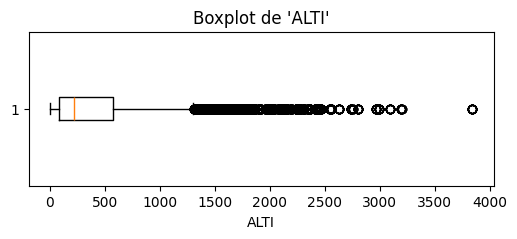

Variable 'RR':
  Q1 = 42.2
  Q3 = 118.6
  IQR = 76.39999999999999
  Borne inférieure = -72.39999999999999
  Borne supérieure = 233.2
  Nombre d'outliers potentiels = 1710
--------------------------------------------------


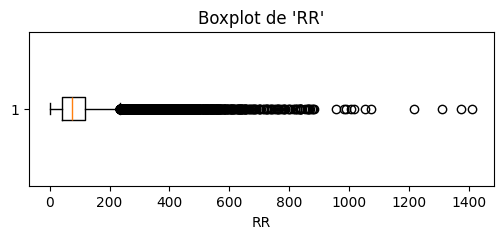

Variable 'QRR':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 323
--------------------------------------------------


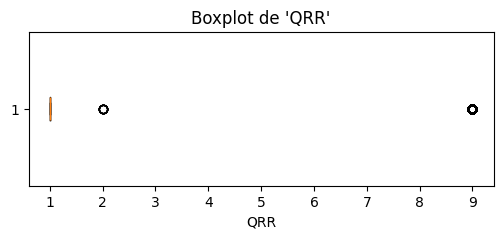

Variable 'NBRR':
  Q1 = 30.0
  Q3 = 31.0
  IQR = 1.0
  Borne inférieure = 28.5
  Borne supérieure = 32.5
  Nombre d'outliers potentiels = 3549
--------------------------------------------------


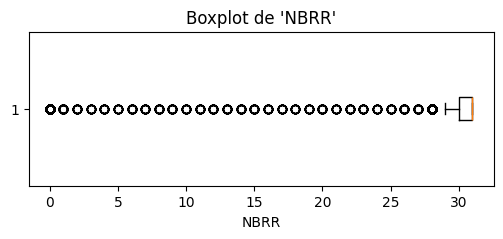

Variable 'RRAB':
  Q1 = 12.6
  Q3 = 31.0
  IQR = 18.4
  Borne inférieure = -14.999999999999998
  Borne supérieure = 58.599999999999994
  Nombre d'outliers potentiels = 1958
--------------------------------------------------


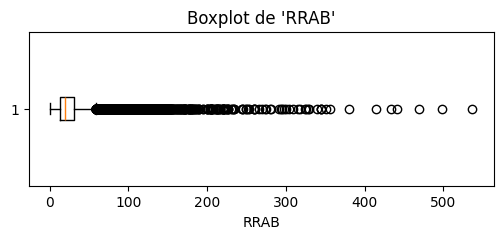

Variable 'QRRAB':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 216
--------------------------------------------------


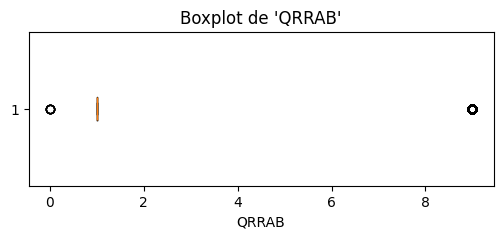

Variable 'RRABDAT':
  Q1 = 9.0
  Q3 = 23.0
  IQR = 14.0
  Borne inférieure = -12.0
  Borne supérieure = 44.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


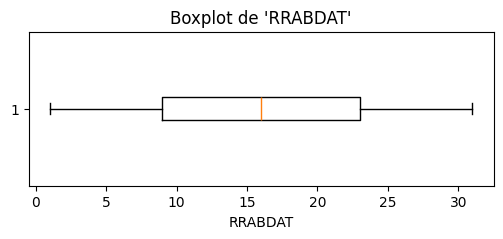

Variable 'NBJRR1':
  Q1 = 6.0
  Q3 = 14.0
  IQR = 8.0
  Borne inférieure = -6.0
  Borne supérieure = 26.0
  Nombre d'outliers potentiels = 77
--------------------------------------------------


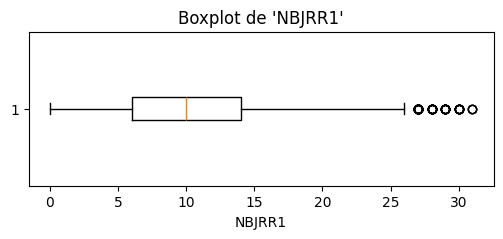

Variable 'NBJRR5':
  Q1 = 3.0
  Q3 = 7.0
  IQR = 4.0
  Borne inférieure = -3.0
  Borne supérieure = 13.0
  Nombre d'outliers potentiels = 950
--------------------------------------------------


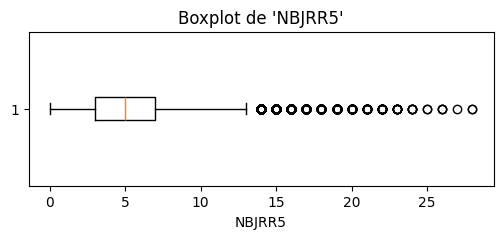

Variable 'NBJRR10':
  Q1 = 1.0
  Q3 = 4.0
  IQR = 3.0
  Borne inférieure = -3.5
  Borne supérieure = 8.5
  Nombre d'outliers potentiels = 1383
--------------------------------------------------


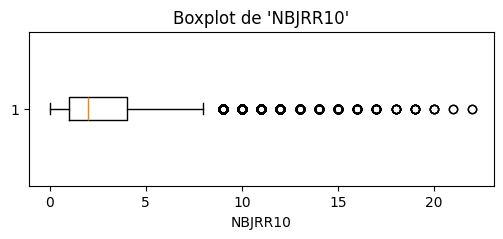

Variable 'NBJRR30':
  Q1 = 0.0
  Q3 = 1.0
  IQR = 1.0
  Borne inférieure = -1.5
  Borne supérieure = 2.5
  Nombre d'outliers potentiels = 1456
--------------------------------------------------


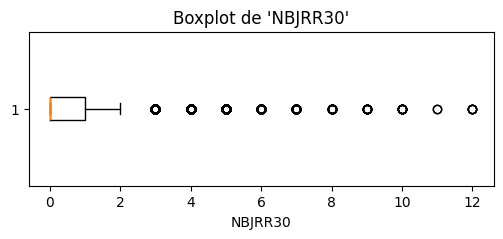

Variable 'NBJRR50':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 2801
--------------------------------------------------


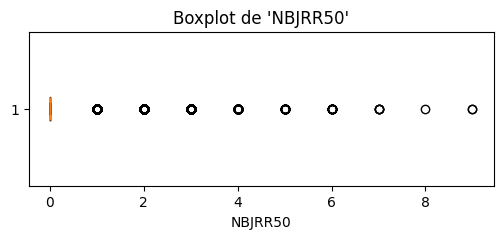

Variable 'NBJRR100':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 589
--------------------------------------------------


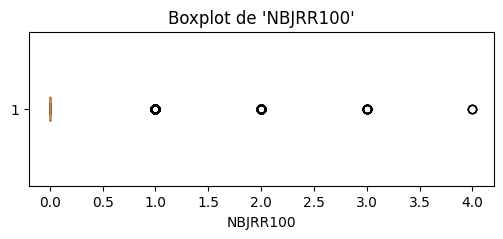

Variable 'NBPMERM':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 2717
--------------------------------------------------


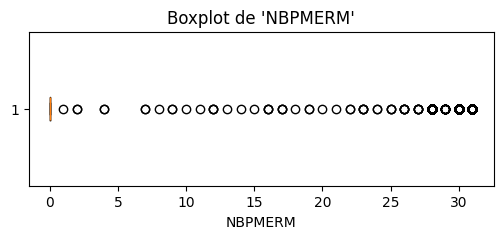

Variable 'TX':
  Q1 = 12.2
  Q3 = 25.9
  IQR = 13.7
  Borne inférieure = -8.349999999999998
  Borne supérieure = 46.449999999999996
  Nombre d'outliers potentiels = 11
--------------------------------------------------


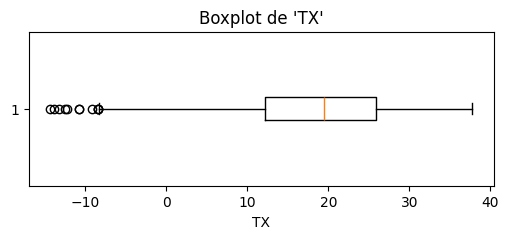

Variable 'QTX':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 237
--------------------------------------------------


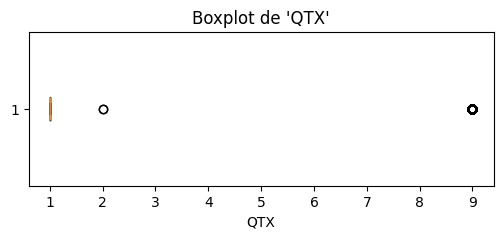

Variable 'NBTX':
  Q1 = 30.0
  Q3 = 31.0
  IQR = 1.0
  Borne inférieure = 28.5
  Borne supérieure = 32.5
  Nombre d'outliers potentiels = 4789
--------------------------------------------------


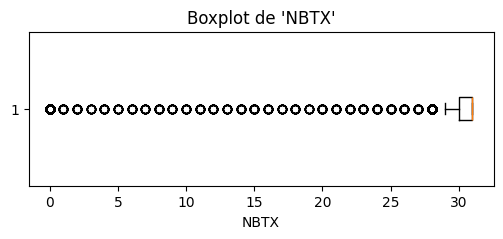

Variable 'TXAB':
  Q1 = 18.9
  Q3 = 31.8
  IQR = 12.900000000000002
  Borne inférieure = -0.45000000000000284
  Borne supérieure = 51.150000000000006
  Nombre d'outliers potentiels = 15
--------------------------------------------------


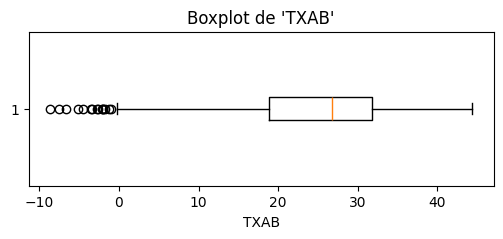

Variable 'QTXAB':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 181
--------------------------------------------------


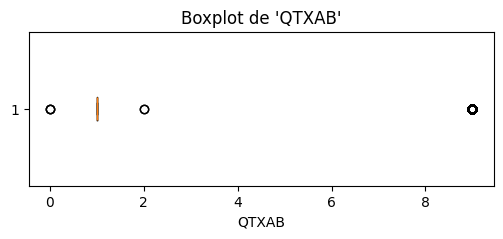

Variable 'TXDAT':
  Q1 = 9.0
  Q3 = 24.0
  IQR = 15.0
  Borne inférieure = -13.5
  Borne supérieure = 46.5
  Nombre d'outliers potentiels = 0
--------------------------------------------------


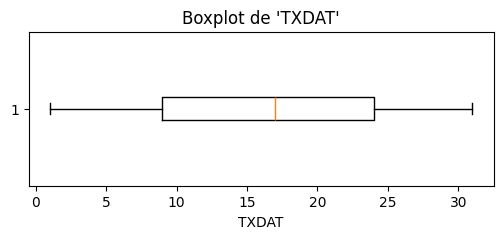

Variable 'TXMIN':
  Q1 = 5.5
  Q3 = 18.9
  IQR = 13.399999999999999
  Borne inférieure = -14.599999999999998
  Borne supérieure = 39.0
  Nombre d'outliers potentiels = 20
--------------------------------------------------


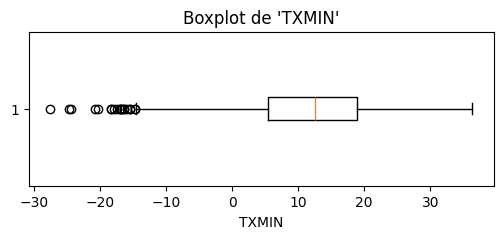

Variable 'QTXMIN':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 171
--------------------------------------------------


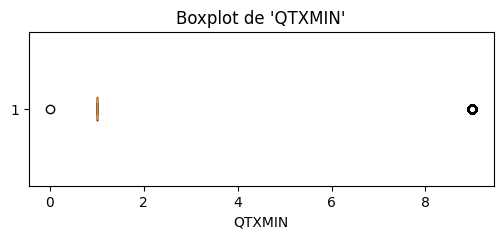

Variable 'TXMINDAT':
  Q1 = 7.0
  Q3 = 25.0
  IQR = 18.0
  Borne inférieure = -20.0
  Borne supérieure = 52.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


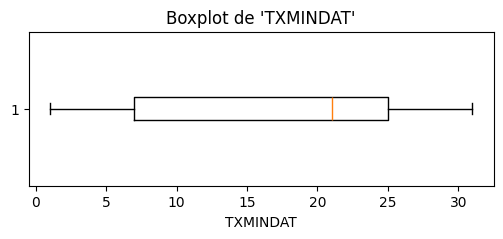

Variable 'NBJTX0':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 2210
--------------------------------------------------


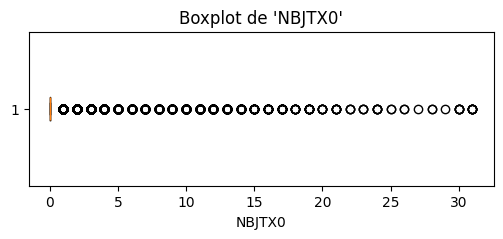

Variable 'NBJTX25':
  Q1 = 0.0
  Q3 = 17.0
  IQR = 17.0
  Borne inférieure = -25.5
  Borne supérieure = 42.5
  Nombre d'outliers potentiels = 0
--------------------------------------------------


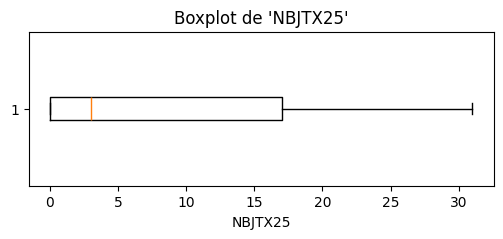

Variable 'NBJTX30':
  Q1 = 0.0
  Q3 = 4.0
  IQR = 4.0
  Borne inférieure = -6.0
  Borne supérieure = 10.0
  Nombre d'outliers potentiels = 3408
--------------------------------------------------


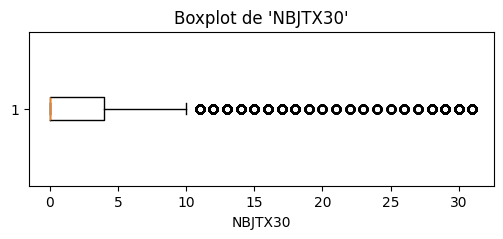

Variable 'NBJTX35':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 2546
--------------------------------------------------


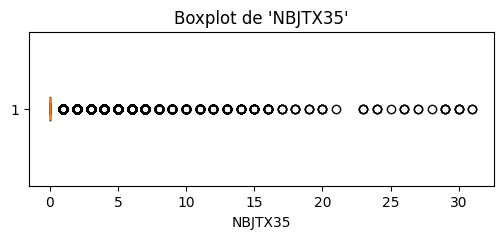

Variable 'NBJTXI20':
  Q1 = 1.0
  Q3 = 29.0
  IQR = 28.0
  Borne inférieure = -41.0
  Borne supérieure = 71.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


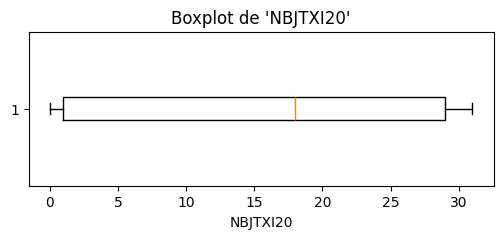

Variable 'NBJTXI27':
  Q1 = 19.0
  Q3 = 31.0
  IQR = 12.0
  Borne inférieure = 1.0
  Borne supérieure = 49.0
  Nombre d'outliers potentiels = 1586
--------------------------------------------------


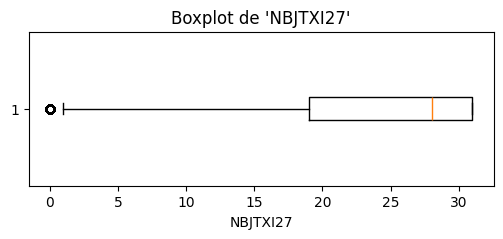

Variable 'NBJTXS32':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 6782
--------------------------------------------------


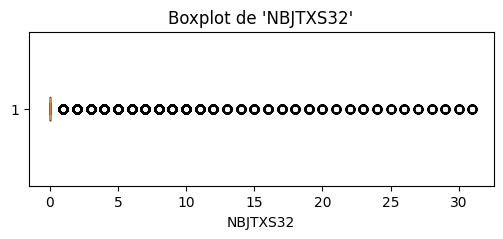

Variable 'TN':
  Q1 = 4.3
  Q3 = 14.0
  IQR = 9.7
  Borne inférieure = -10.25
  Borne supérieure = 28.549999999999997
  Nombre d'outliers potentiels = 41
--------------------------------------------------


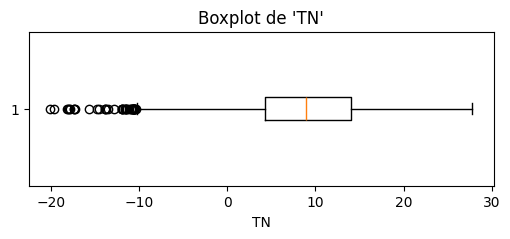

Variable 'QTN':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 242
--------------------------------------------------


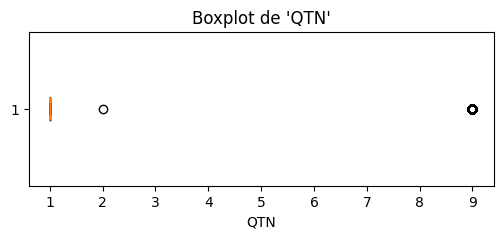

Variable 'NBTN':
  Q1 = 30.0
  Q3 = 31.0
  IQR = 1.0
  Borne inférieure = 28.5
  Borne supérieure = 32.5
  Nombre d'outliers potentiels = 4791
--------------------------------------------------


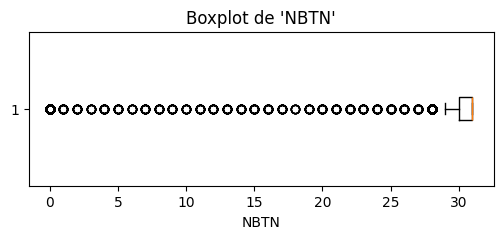

Variable 'TNAB':
  Q1 = -3.4
  Q3 = 8.5
  IQR = 11.9
  Borne inférieure = -21.25
  Borne supérieure = 26.35
  Nombre d'outliers potentiels = 23
--------------------------------------------------


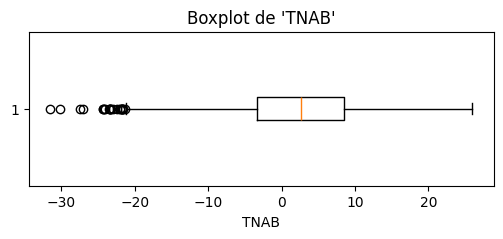

Variable 'QTNAB':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 176
--------------------------------------------------


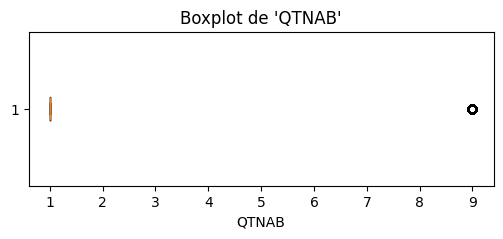

Variable 'TNDAT':
  Q1 = 6.0
  Q3 = 24.0
  IQR = 18.0
  Borne inférieure = -21.0
  Borne supérieure = 51.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


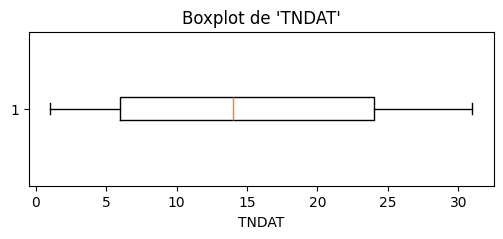

Variable 'TNMAX':
  Q1 = 11.1
  Q3 = 18.9
  IQR = 7.799999999999999
  Borne inférieure = -0.5999999999999996
  Borne supérieure = 30.599999999999998
  Nombre d'outliers potentiels = 119
--------------------------------------------------


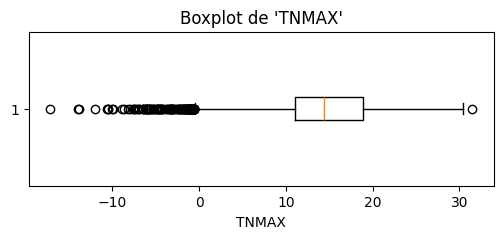

Variable 'QTNMAX':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 182
--------------------------------------------------


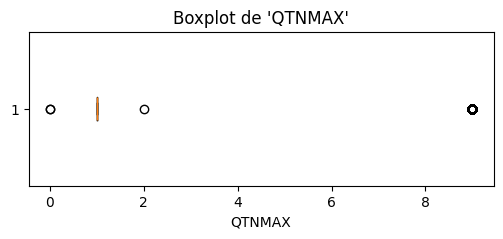

Variable 'TNMAXDAT':
  Q1 = 11.0
  Q3 = 23.0
  IQR = 12.0
  Borne inférieure = -7.0
  Borne supérieure = 41.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


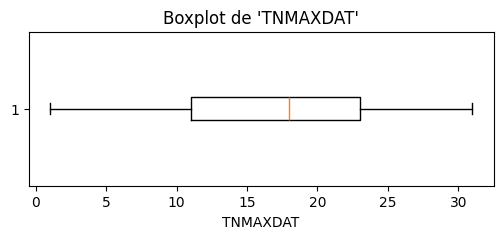

Variable 'NBJTN5':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 4629
--------------------------------------------------


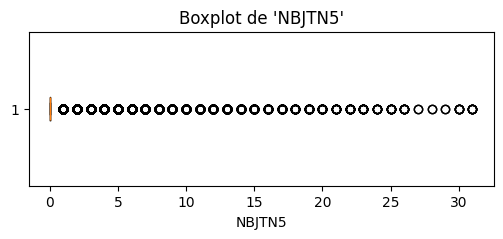

Variable 'NBJTN10':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 927
--------------------------------------------------


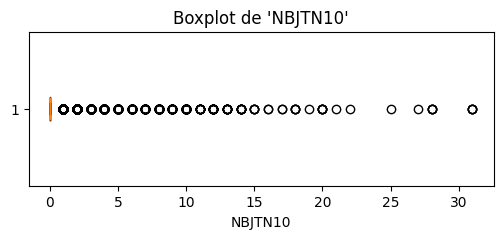

Variable 'NBJTNI10':
  Q1 = 3.0
  Q3 = 28.0
  IQR = 25.0
  Borne inférieure = -34.5
  Borne supérieure = 65.5
  Nombre d'outliers potentiels = 0
--------------------------------------------------


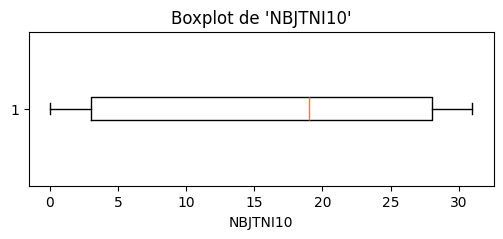

Variable 'NBJTNI15':
  Q1 = 18.0
  Q3 = 31.0
  IQR = 13.0
  Borne inférieure = -1.5
  Borne supérieure = 50.5
  Nombre d'outliers potentiels = 0
--------------------------------------------------


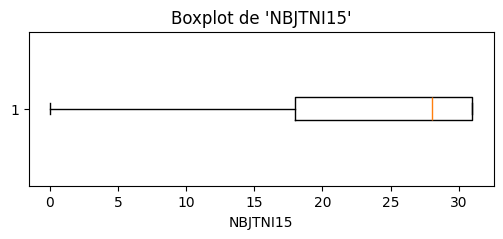

Variable 'NBJTNI20':
  Q1 = 29.0
  Q3 = 31.0
  IQR = 2.0
  Borne inférieure = 26.0
  Borne supérieure = 34.0
  Nombre d'outliers potentiels = 3619
--------------------------------------------------


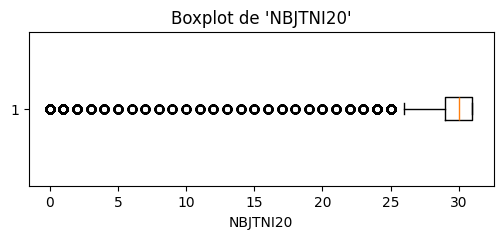

Variable 'NBJTNS20':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 5619
--------------------------------------------------


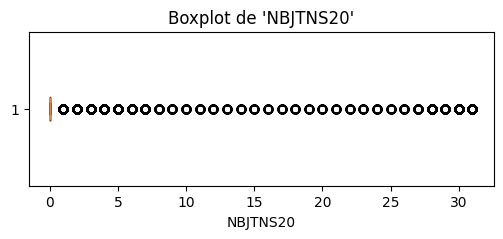

Variable 'NBJTNS25':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 1483
--------------------------------------------------


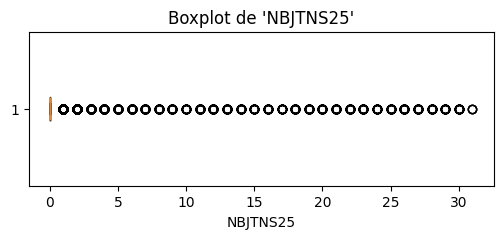

Variable 'NBJGELEE':
  Q1 = 0.0
  Q3 = 5.0
  IQR = 5.0
  Borne inférieure = -7.5
  Borne supérieure = 12.5
  Nombre d'outliers potentiels = 2809
--------------------------------------------------


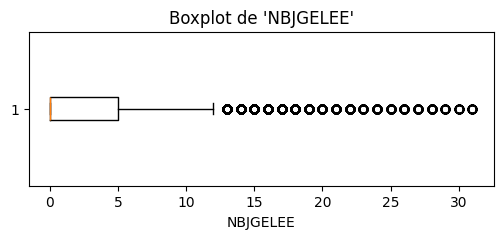

Variable 'TAMPLIM':
  Q1 = 7.3
  Q3 = 11.6
  IQR = 4.3
  Borne inférieure = 0.8500000000000005
  Borne supérieure = 18.049999999999997
  Nombre d'outliers potentiels = 76
--------------------------------------------------


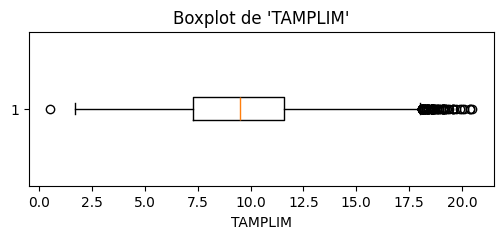

Variable 'QTAMPLIM':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 228
--------------------------------------------------


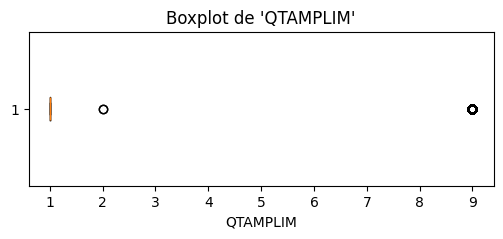

Variable 'TAMPLIAB':
  Q1 = 12.5
  Q3 = 19.2
  IQR = 6.699999999999999
  Borne inférieure = 2.450000000000001
  Borne supérieure = 29.25
  Nombre d'outliers potentiels = 21
--------------------------------------------------


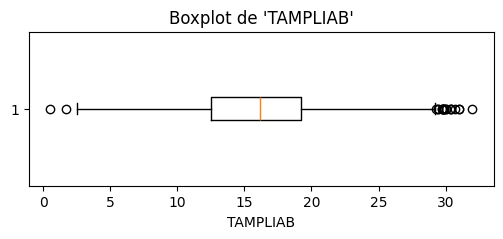

Variable 'QTAMPLIAB':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 175
--------------------------------------------------


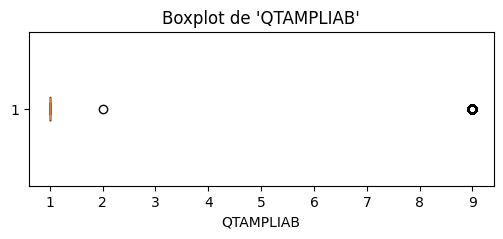

Variable 'TAMPLIABDAT':
  Q1 = 9.0
  Q3 = 23.0
  IQR = 14.0
  Borne inférieure = -12.0
  Borne supérieure = 44.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


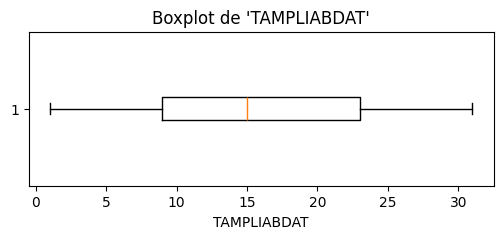

Variable 'NBTAMPLI':
  Q1 = 30.0
  Q3 = 31.0
  IQR = 1.0
  Borne inférieure = 28.5
  Borne supérieure = 32.5
  Nombre d'outliers potentiels = 4810
--------------------------------------------------


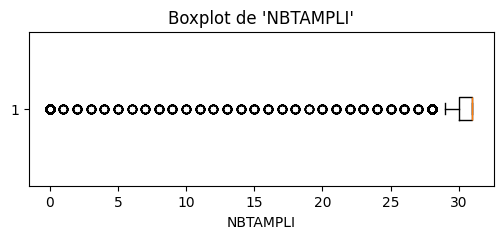

Variable 'TM':
  Q1 = 8.2
  Q3 = 20.0
  IQR = 11.8
  Borne inférieure = -9.500000000000004
  Borne supérieure = 37.7
  Nombre d'outliers potentiels = 14
--------------------------------------------------


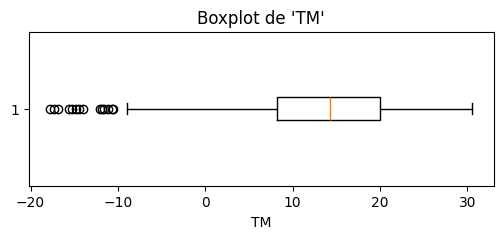

Variable 'QTM':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 257
--------------------------------------------------


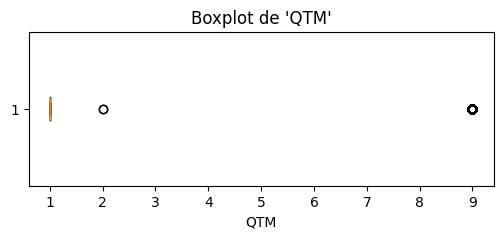

Variable 'NBTM':
  Q1 = 30.0
  Q3 = 31.0
  IQR = 1.0
  Borne inférieure = 28.5
  Borne supérieure = 32.5
  Nombre d'outliers potentiels = 4810
--------------------------------------------------


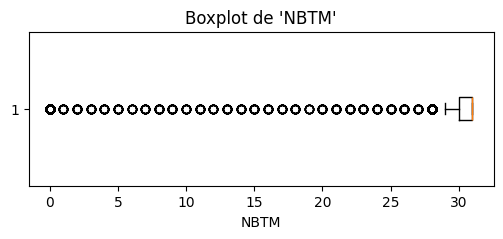

Variable 'TMM':
  Q1 = 8.2
  Q3 = 19.4
  IQR = 11.2
  Borne inférieure = -8.599999999999998
  Borne supérieure = 36.199999999999996
  Nombre d'outliers potentiels = 15
--------------------------------------------------


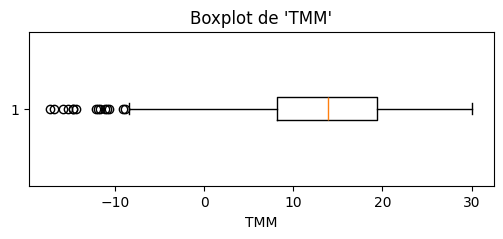

Variable 'QTMM':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 207
--------------------------------------------------


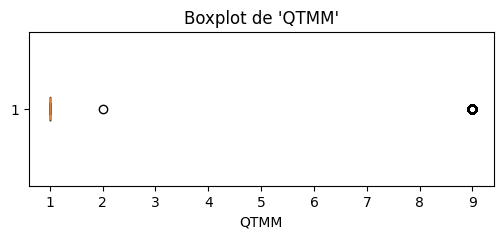

Variable 'NBTMM':
  Q1 = 30.0
  Q3 = 31.0
  IQR = 1.0
  Borne inférieure = 28.5
  Borne supérieure = 32.5
  Nombre d'outliers potentiels = 5658
--------------------------------------------------


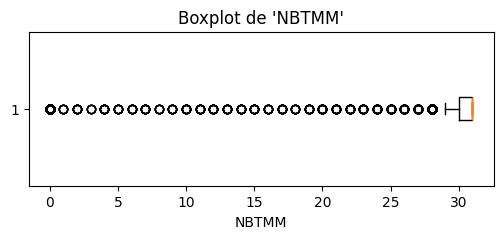

Variable 'NBJTMS24':
  Q1 = 0.0
  Q3 = 1.0
  IQR = 1.0
  Borne inférieure = -1.5
  Borne supérieure = 2.5
  Nombre d'outliers potentiels = 5611
--------------------------------------------------


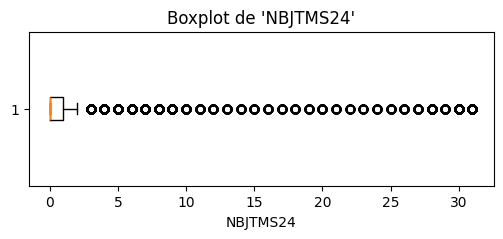

Variable 'TMMIN':
  Q1 = 1.8
  Q3 = 15.1
  IQR = 13.299999999999999
  Borne inférieure = -18.15
  Borne supérieure = 35.05
  Nombre d'outliers potentiels = 19
--------------------------------------------------


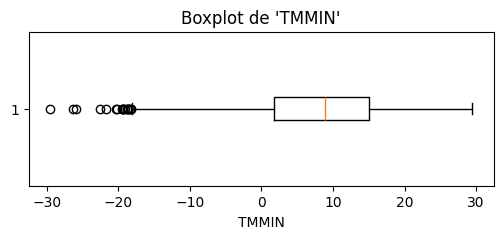

Variable 'QTMMIN':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 179
--------------------------------------------------


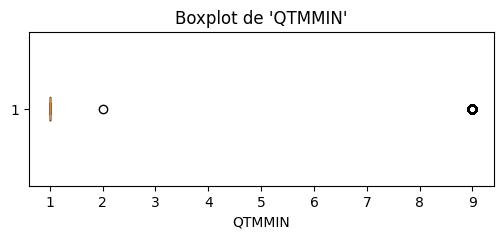

Variable 'TMMINDAT':
  Q1 = 6.0
  Q3 = 25.0
  IQR = 19.0
  Borne inférieure = -22.5
  Borne supérieure = 53.5
  Nombre d'outliers potentiels = 0
--------------------------------------------------


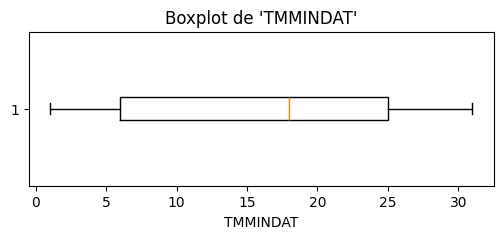

Variable 'TMMAX':
  Q1 = 14.1
  Q3 = 24.7
  IQR = 10.6
  Borne inférieure = -1.799999999999999
  Borne supérieure = 40.599999999999994
  Nombre d'outliers potentiels = 33
--------------------------------------------------


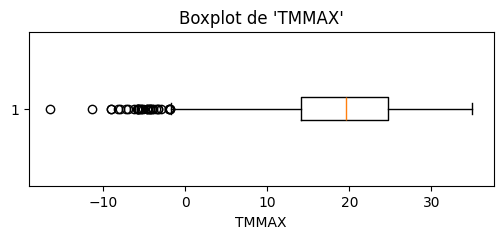

Variable 'QTMMAX':
  Q1 = 1.0
  Q3 = 1.0
  IQR = 0.0
  Borne inférieure = 1.0
  Borne supérieure = 1.0
  Nombre d'outliers potentiels = 187
--------------------------------------------------


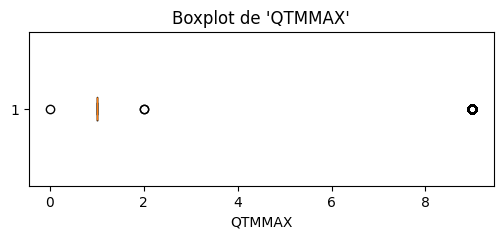

Variable 'TMMAXDAT':
  Q1 = 10.0
  Q3 = 24.0
  IQR = 14.0
  Borne inférieure = -11.0
  Borne supérieure = 45.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


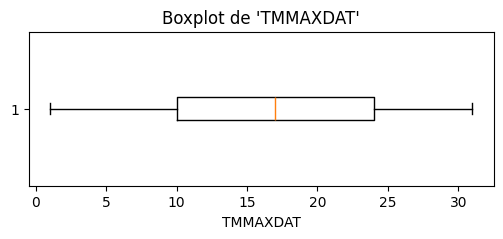

Variable 'NBUN':
  Q1 = 0.0
  Q3 = 30.0
  IQR = 30.0
  Borne inférieure = -45.0
  Borne supérieure = 75.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


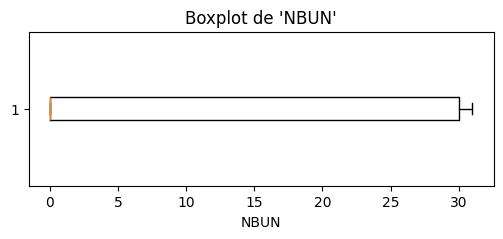

Variable 'NBUX':
  Q1 = 0.0
  Q3 = 30.0
  IQR = 30.0
  Borne inférieure = -45.0
  Borne supérieure = 75.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


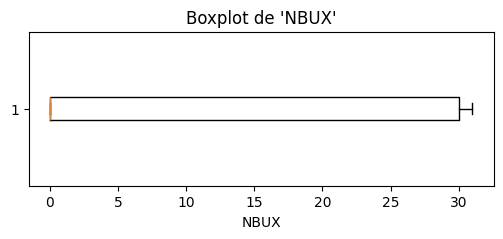

Variable 'NBUM':
  Q1 = 0.0
  Q3 = 30.0
  IQR = 30.0
  Borne inférieure = -45.0
  Borne supérieure = 75.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


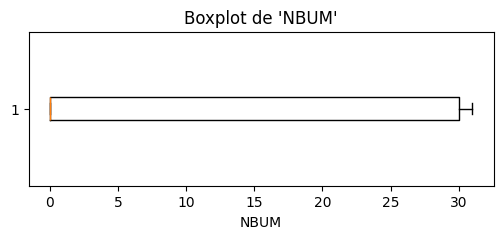

Variable 'NBTSVM':
  Q1 = 0.0
  Q3 = 30.0
  IQR = 30.0
  Borne inférieure = -45.0
  Borne supérieure = 75.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


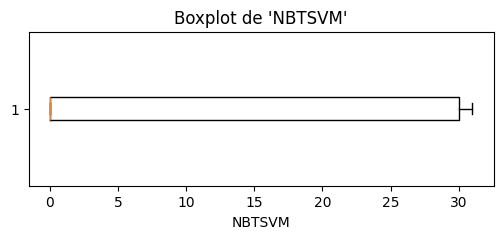

Variable 'NBFXI':
  Q1 = 0.0
  Q3 = 30.0
  IQR = 30.0
  Borne inférieure = -45.0
  Borne supérieure = 75.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


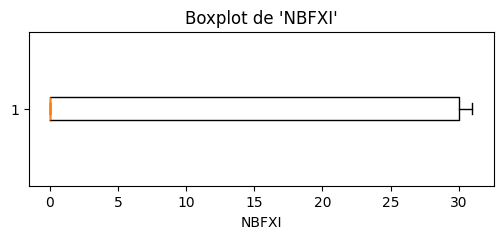

Variable 'NBFXI3S':
  Q1 = 0.0
  Q3 = 28.0
  IQR = 28.0
  Borne inférieure = -42.0
  Borne supérieure = 70.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


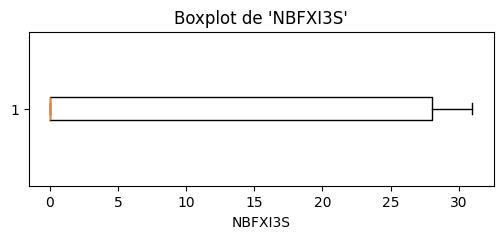

Variable 'NBFXY':
  Q1 = 0.0
  Q3 = 30.0
  IQR = 30.0
  Borne inférieure = -45.0
  Borne supérieure = 75.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


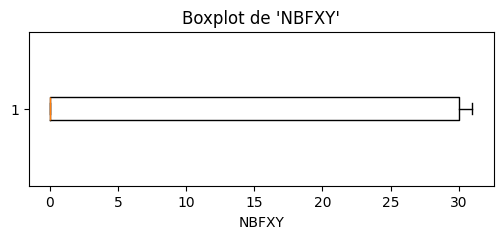

Variable 'NBFFM':
  Q1 = 0.0
  Q3 = 30.0
  IQR = 30.0
  Borne inférieure = -45.0
  Borne supérieure = 75.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


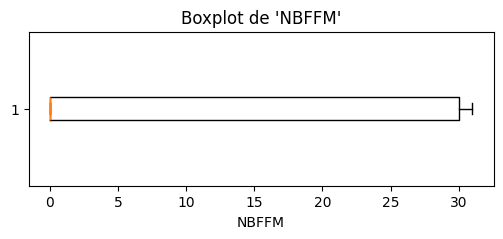

Variable 'NBINST':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 2680
--------------------------------------------------


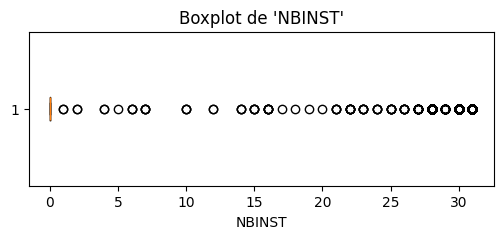

Variable 'NBGLOT':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 3292
--------------------------------------------------


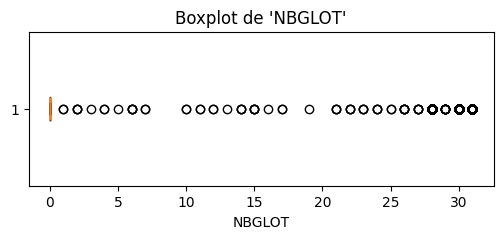

Variable 'NBDIFT':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 0
--------------------------------------------------


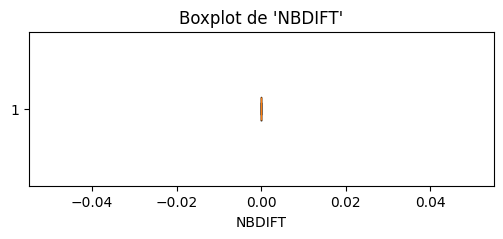

Variable 'NBDIRT':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 77
--------------------------------------------------


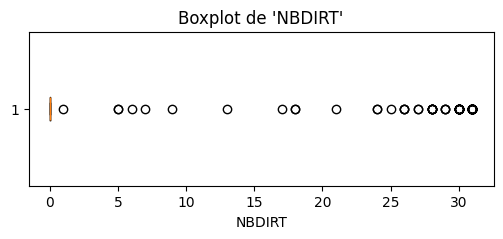

Variable 'NBHNEIGEF':
  Q1 = 0.0
  Q3 = 0.0
  IQR = 0.0
  Borne inférieure = 0.0
  Borne supérieure = 0.0
  Nombre d'outliers potentiels = 1763
--------------------------------------------------


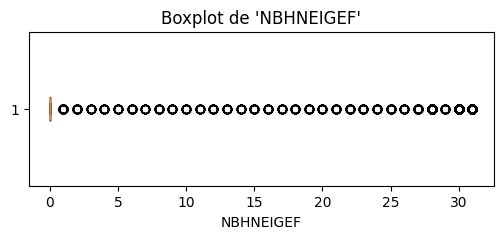

In [ ]:
# Exclusion des colonnes non pertinentes pour le contrôle des outliers
colonnes_a_analyser = [col for col in colonnes_numeriques if col not in ['NUM_POSTE', 'AAAAMM', 'DEP', 'LAT', 'LON']]

for col in colonnes_a_analyser:
    # Calcul des quartiles et de l'IQR pour la variable
    Q1 = base_clim_clean[col].quantile(0.25)
    Q3 = base_clim_clean[col].quantile(0.75)
    IQR = Q3 - Q1
    borne_inferieure = Q1 - 1.5 * IQR
    borne_superieure = Q3 + 1.5 * IQR

    # Comptage des outliers
    nb_outliers = base_clim_clean[(base_clim_clean[col] < borne_inferieure) |
                                  (base_clim_clean[col] > borne_superieure)].shape[0]

    print(f"Variable '{col}':")
    print(f"  Q1 = {Q1}")
    print(f"  Q3 = {Q3}")
    print(f"  IQR = {IQR}")
    print(f"  Borne inférieure = {borne_inferieure}")
    print(f"  Borne supérieure = {borne_superieure}")
    print(f"  Nombre d'outliers potentiels = {nb_outliers}")
    print("-" * 50)

    # Affichage d'un boxplot pour visualiser la distribution
    plt.figure(figsize=(6, 2))
    plt.boxplot(base_clim_clean[col].dropna(), vert=False)
    plt.title(f"Boxplot de '{col}'")
    plt.xlabel(col)
    plt.show()


In [ ]:
# Vérification des limites attendues pour LAT, LON et ALTI pour la France métropolitaine (et corse)

# Pour LAT : on attend des valeurs entre 41 et 52 degrés
nombre_lat_hors_plage = base_clim_clean[(base_clim_clean['LAT'] < 41.0) | (base_clim_clean['LAT'] > 52.0)].shape[0]
total_lat = base_clim_clean.shape[0]
print(f"Nombre de valeurs de LAT hors de [41, 52] : {nombre_lat_hors_plage} sur {total_lat} ({100 * nombre_lat_hors_plage / total_lat:.2f}%)")

# Pour LON : on attend des valeurs entre -6 et 10 degrés
nombre_lon_hors_plage = base_clim_clean[(base_clim_clean['LON'] < -6.0) | (base_clim_clean['LON'] > 10.0)].shape[0]
total_lon = base_clim_clean.shape[0]
print(f"Nombre de valeurs de LON hors de [-6, 10] : {nombre_lon_hors_plage} sur {total_lon} ({100 * nombre_lon_hors_plage / total_lon:.2f}%)")

# Pour ALTI : on attend des valeurs entre 0 et 4000 mètres
nombre_alti_hors_plage = base_clim_clean[(base_clim_clean['ALTI'] < 0) | (base_clim_clean['ALTI'] > 4000)].shape[0]
total_alti = base_clim_clean.shape[0]
print(f"Nombre de valeurs d'ALTI hors de [0, 4000] : {nombre_alti_hors_plage} sur {total_alti} ({100 * nombre_alti_hors_plage / total_alti:.2f}%)")


Nombre de valeurs de LAT hors de [41, 52] : 4736 sur 28162 (16.82%)
Nombre de valeurs de LON hors de [-6, 10] : 4748 sur 28162 (16.86%)
Nombre de valeurs d'ALTI hors de [0, 4000] : 0 sur 28162 (0.00%)


In [ ]:
# Extraction des enregistrements dont la latitude est en dehors de l'intervalle logique [41, 52]
outliers_LAT = base_clim_clean[(base_clim_clean['LAT'] < 41.0) | (base_clim_clean['LAT'] > 52.0)]
print("Exemple d'observations avec LAT hors de l'intervalle [41, 52] :")
print(outliers_LAT[['NUM_POSTE', 'NOM_USUEL', 'LAT', 'LON']].head(20))

# Extraction des enregistrements dont la longitude est en dehors de l'intervalle logique [-6, 10]
outliers_LON = base_clim_clean[(base_clim_clean['LON'] < -6.0) | (base_clim_clean['LON'] > 10.0)]
print("\nExemple d'observations avec LON hors de l'intervalle [-6, 10] :")
print(outliers_LON[['NUM_POSTE', 'NOM_USUEL', 'LAT', 'LON']].head(20))

Exemple d'observations avec LAT hors de l'intervalle [41, 52] :
       NUM_POSTE                NOM_USUEL        LAT        LON
23414   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23415   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23416   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23417   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23418   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23419   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23420   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23421   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23422   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23423   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23424   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23425   97101001    LES ABYMES BOYVINIERE  16.297833 -61.497000
23426   97101014  LES ABYMES CHAZEAU_SAPC  16.287500 -61.453167
23427   97101014  LES ABYMES CHAZEAU_SAP

**On remarque que ce sont des communes sur des territoires d'outre-mer donc rien d'alarmant.**

**Remarque métier sur les précipitations :**

Les variables 'RR' (cumul mensuel des précipitations) et 'RRAB' (précipitation maximale sur 24h) peuvent présenter des valeurs très élevées dues à des événements extrêmes réels. Nous ne les modifions pas ici car il est important de les examiner en détail avant de décider d'une éventuelle winsorisation ou autre traitement spécifique.


In [ ]:
# Définir les bornes supérieures issues de la méthode IQR
borne_sup_RR = 233.2
borne_sup_RRAB = 58.6

# Détection des valeurs aberrantes sur RR
outliers_rr = base_clim_clean[base_clim_clean['RR'] > borne_sup_RR]
print("Top communes avec précipitations mensuelles RR > 233.2 :")
print(outliers_rr['NOM_USUEL'].value_counts().head(20))

# Détection des valeurs aberrantes sur RRAB
outliers_rrab = base_clim_clean[base_clim_clean['RRAB'] > borne_sup_RRAB]
print("\nTop communes avec RRAB (max 24h) > 58.6 :")
print(outliers_rrab['NOM_USUEL'].value_counts().head(20))

Top communes avec précipitations mensuelles RR > 233.2 :
NOM_USUEL
CAPESTERRE-B-EAU CARBET_SAPC    12
ST-CLAUDE MAISON-VOLCAN_SAPC    12
LE TREMBLET                     11
ST-CLAUDE CITERNE               11
MORNE-ROUGE-CHAMP               11
HAUTS DE SAINTE-ROSE_SAPC       11
ST-CLAUDE MATOUBA_SAPC          10
LE BARIL                         9
FORT-FRANCE COLSON               9
GROS-MORNE BELLEVUE_SAPC         9
GROS PITON SAINTE-ROSE           9
HIHIFO DOUBLON                   8
AVERA 5                          8
MAOPOOPO                         8
BRAS-PISTOLET_SAPC               8
REGINA                           8
HIHIFO                           8
BELLEVUE BRAS-PANON              8
TAKAMAKA - PK12_SAPC             8
GOURBEYRE GROS-MORNE DOLE        8
Name: count, dtype: int64

Top communes avec RRAB (max 24h) > 58.6 :
NOM_USUEL
CAPESTERRE-B-EAU CARBET_SAPC    11
HAUTS DE SAINTE-ROSE_SAPC       10
LE TREMBLET                     10
ST-CLAUDE MAISON-VOLCAN_SAPC    10
ST-CLAUDE CITE

In [ ]:
# Départements métropolitains = entre 1 et 95
rr_metro = base_clim_clean[(base_clim_clean['RR'] > 233.2) & (base_clim_clean['DEP'] <= 95)]
rrab_metro = base_clim_clean[(base_clim_clean['RRAB'] > 58.6) & (base_clim_clean['DEP'] <= 95)]

print("Communes métropolitaines avec RR > 233.2 :")
print(rr_metro['NOM_USUEL'].value_counts().head(20))

print("\nCommunes métropolitaines avec RRAB > 58.6 :")
print(rrab_metro['NOM_USUEL'].value_counts().head(20))


Communes métropolitaines avec RR > 233.2 :
NOM_USUEL
BALLON_SAPC                5
RUPT-SUR-MOSELLE           5
BALLON DE SERVANCE         5
PLANCHER-LES-MI            5
GRANDE-CHARTREUSE          5
SEWEN - LAC ALFELD_SAPC    5
ALLEMOND                   5
FLAINE_SAPC                4
MEGEVE                     4
LE GRAND-BORNAND           4
GERARDMER                  4
THONES                     4
HAUTELUCE                  4
MILLEVACHES                4
LE MONT-DORE_SAPC          4
LE BOUCHET_SAPC            4
CHATEL                     4
CLUSAZ (LA)                4
LA_BRESSE_SAPC             4
LE LIORAN_SAPC             4
Name: count, dtype: int64

Communes métropolitaines avec RRAB > 58.6 :
NOM_USUEL
UREPEL_SAPC              5
ASCO_SAPC                5
LE MONT-DORE_SAPC        4
ISOLA 2000               4
ST-PIERRE-D'ENTREMONT    4
EVISA-ONF                4
VIVARIO_SAPC             4
SAMPOLO                  4
BOCOGNANO-GARE           4
RESTONICA_SAPC           4
LE LIORAN_SAPC  

In [ ]:
# Seuils métier pour valeurs de précipitations jugées aberrantes
seuil_rr_extreme = 1500   # RR en dixièmes de mm -> 150 mm
seuil_rrab_extreme = 600  # RRAB en dixièmes de mm -> 60 mm en 24h

# Filtrage des cas extrêmes pour RR
rr_extremes = base_clim_clean[base_clim_clean['RR'] > seuil_rr_extreme]
top_rr_extremes = rr_extremes['NOM_USUEL'].value_counts().head(20)
print("Communes avec RR > 1500 (valeurs jugées aberrantes) :")
print(top_rr_extremes)

# Filtrage des cas extrêmes pour RRAB
rrab_extremes = base_clim_clean[base_clim_clean['RRAB'] > seuil_rrab_extreme]
top_rrab_extremes = rrab_extremes['NOM_USUEL'].value_counts().head(20)
print("\nCommunes avec RRAB > 600 (valeurs jugées aberrantes) :")
print(top_rrab_extremes)


Communes avec RR > 1500 (valeurs jugées aberrantes) :
Series([], Name: count, dtype: int64)

Communes avec RRAB > 600 (valeurs jugées aberrantes) :
Series([], Name: count, dtype: int64)


In [ ]:
# Export de la base géographique finale
export_path = "/content/drive/MyDrive/Projet Data/base_clim_clean.csv"
base_clim_clean.to_csv(export_path, index=False)
print("Base clim clean exportée dans :", export_path)

Base clim clean exportée dans : /content/drive/MyDrive/Projet Data/base_clim_clean.csv


## Jointure des bases de données Fremuni Clean avec Climatiques

On importe et traite d'abord un fichier sur toutes les communes en France trouvé sur data.gouv.fr

In [ ]:
fremuni = pd.read_csv("/content/drive/MyDrive/Projet Data/bdd_fremuni_clean.csv")

In [ ]:
communes_geo = pd.read_csv("/content/drive/MyDrive/Projet Data/communes-france-2025.csv")
communes_geo.drop(communes_geo.columns[0], axis=1, inplace=True)
communes_geo.head()

<ipython-input-81-ffeaa8759daf>:1: DtypeWarning: Columns (1,12,14,16,23,24) have mixed types. Specify dtype option on import or set low_memory=False.
  communes_geo = pd.read_csv("/content/drive/MyDrive/Projet Data/communes-france-2025.csv")


,code_insee,nom_standard,nom_sans_pronom,nom_a,nom_de,nom_sans_accent,nom_standard_majuscule,typecom,typecom_texte,reg_code,...,longitude_mairie,latitude_centre,longitude_centre,grille_densite,grille_densite_texte,niveau_equipements_services,niveau_equipements_services_texte,gentile,url_wikipedia,url_villedereve
0,01001,L'Abergement-Clémenciat,Abergement-Clémenciat,à Abergement-Clémenciat,de l'Abergement-Clémenciat,l-abergement-clemenciat,L'ABERGEMENT-CLÉMENCIAT,COM,commune,84,...,4.921,46.153,4.926,6,Rural à habitat dispersé,0.0,communes non pôle,NaN,https://fr.wikipedia.org/wiki/fr:L'Abergement-...,https://villedereve.fr/ville/01001-l-abergemen...
1,01002,L'Abergement-de-Varey,Abergement-de-Varey,à Abergement-de-Varey,de l'Abergement-de-Varey,l-abergement-de-varey,L'ABERGEMENT-DE-VAREY,COM,commune,84,...,5.423,46.009,5.428,6,Rural à habitat dispersé,0.0,communes non pôle,"Abergementais, Abergementaises",https://fr.wikipedia.org/wiki/fr:L'Abergement-...,https://villedereve.fr/ville/01002-l-abergemen...
2,01004,Ambérieu-en-Bugey,Ambérieu-en-Bugey,à Ambérieu-en-Bugey,d'Ambérieu-en-Bugey,amberieu-en-bugey,AMBÉRIEU-EN-BUGEY,COM,commune,84,...,5.360,45.961,5.373,2,Centres urbains intermédiaires,3.0,centres structurants d'équipements et de services,"Ambarrois, Ambarroises",https://fr.wikipedia.org/wiki/fr:Ambérieu-en-B...,https://villedereve.fr/ville/01004-amberieu-en...
3,01005,Ambérieux-en-Dombes,Ambérieux-en-Dombes,à Ambérieux-en-Dombes,d'Ambérieux-en-Dombes,amberieux-en-dombes,AMBÉRIEUX-EN-DOMBES,COM,commune,84,...,4.903,45.996,4.912,5,Bourgs ruraux,1.0,centres locaux d'équipements et de services,Ambarrois,https://fr.wikipedia.org/wiki/fr:Ambérieux-en-...,https://villedereve.fr/ville/01005-amberieux-e...
4,01006,Ambléon,Ambléon,à Ambléon,d'Ambléon,ambleon,AMBLÉON,COM,commune,84,...,5.601,45.750,5.594,6,Rural à habitat dispersé,0.0,communes non pôle,Ambléonais,https://fr.wikipedia.org/wiki/fr:Ambléon,https://villedereve.fr/ville/01006-ambleon


In [ ]:
# Forçage du format INSEE sur 5 chiffres
fremuni['INSEE_COM'] = fremuni['INSEE_COM'].astype(str).str.zfill(5)
communes_geo['code_insee'] = communes_geo['code_insee'].astype(str).str.zfill(5)

In [ ]:
# Sélection avec renommage
coords_all_clean = communes_geo[['code_insee', 'latitude_centre', 'longitude_centre']].rename(
    columns={'code_insee': 'INSEE_COM', 'latitude_centre': 'LAT', 'longitude_centre': 'LON'}
)

# Fusion propre
bdd_fremuni_clean_with_gps = fremuni.merge(coords_all_clean, on='INSEE_COM', how='left')
bdd_fremuni_clean_with_gps.head()

,PK_UID,INSEE_COM,NOM_COM,DEPT,X1,X2,X3,X4,X5,X6,...,Y11,Y12,Y13,Y14,Y15,Y16,Y17,Y18,LAT,LON
0,2,47033,BOUDY-DE-BEAUREGARD,47,513668.0,515868.9,516216.1,516992.9,516922.7,517448.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.544,0.678
1,3,32009,ARMOUS-ET-CAU,32,470691.8,472102.8,472474.9,473151.9,474752.3,474744.6,...,6278775.9,6279747.7,NaN,NaN,NaN,NaN,NaN,NaN,43.573,0.187
2,4,38225,MEAUDRE,38,896082.3,895867.5,895965.9,897019.5,897739.6,899078.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.132,5.529
3,6,08018,ARDEUIL-ET-MONTFAUXELLES,08,822620.7,824604.8,825043.6,825484.9,824074.9,823044.8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49.267,4.705
4,7,32113,CRAVENCERES,32,459389.3,459073.8,459323.1,461029.4,461427.0,462193.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.774,0.030


In [ ]:
# Vérifier le nombre de valeurs manquantes dans les coordonnées
nb_nan_lat = bdd_fremuni_clean_with_gps['LAT'].isna().sum()
nb_nan_lon = bdd_fremuni_clean_with_gps['LON'].isna().sum()
total_lignes = bdd_fremuni_clean_with_gps.shape[0]

# Affichage du résultat
print(f"Nombre de lignes sans LAT : {nb_nan_lat} / {total_lignes} ({nb_nan_lat / total_lignes * 100:.2f}%)")
print(f"Nombre de lignes sans LON : {nb_nan_lon} / {total_lignes} ({nb_nan_lon / total_lignes * 100:.2f}%)")

# Affichage de quelques lignes concernées (si besoin)
print("\n🔍 Exemples de lignes avec coordonnées manquantes :")
print(bdd_fremuni_clean_with_gps[bdd_fremuni_clean_with_gps['LAT'].isna() | bdd_fremuni_clean_with_gps['LON'].isna()].head(10))


Nombre de lignes sans LAT : 1213 / 23928 (5.07%)
Nombre de lignes sans LON : 1213 / 23928 (5.07%)

🔍 Exemples de lignes avec coordonnées manquantes :
     PK_UID INSEE_COM              NOM_COM DEPT        X1        X2        X3  \
38       60     24044         BLIS-ET-BORN   24  532272.1  536345.2  537405.3   
67      104     24103            LE CHANGE   24  531486.2  532063.4  531962.2   
119     200     46325              VAILLAC   46  580038.0  580339.5  581256.8   
141     234     49207             MONTFORT   49  455584.9  456560.1  457099.1   
148     241     38541     VEYRINS-THUELLIN   38  894607.6  895101.0  895287.5   
156     252     49325  LA SALLE-DE-VIHIERS   49  422527.9  422568.6  423728.7   
158     255     39509               SENAUD   39  881876.3  881762.0  882173.3   
182     288     39542   VALFIN-SUR-VALOUSE   39  891929.6  891933.3  893194.6   
193     304     85150            MORMAISON   85  358709.5  359969.9  360947.0   
210     331     27160             CIVIER

In [ ]:
# Suppression uniquement des lignes sans coordonnées finales
fremuni_final = bdd_fremuni_clean_with_gps.dropna(subset=['LAT', 'LON'])
fremuni_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22715 entries, 0 to 23927
Data columns (total 42 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PK_UID     22715 non-null  int64  
 1   INSEE_COM  22715 non-null  object 
 2   NOM_COM    22715 non-null  object 
 3   DEPT       22715 non-null  object 
 4   X1         22715 non-null  float64
 5   X2         22715 non-null  float64
 6   X3         22715 non-null  float64
 7   X4         22715 non-null  float64
 8   X5         22715 non-null  float64
 9   X6         22715 non-null  float64
 10  X7         22715 non-null  float64
 11  X8         22715 non-null  float64
 12  X9         22701 non-null  float64
 13  X10        22701 non-null  float64
 14  X11        22566 non-null  float64
 15  X12        22566 non-null  float64
 16  X13        22022 non-null  float64
 17  X14        22022 non-null  float64
 18  X15        20758 non-null  float64
 19  X16        20758 non-null  float64
 20  X17        

In [ ]:
print(base_clim_clean.columns.tolist())


['NUM_POSTE', 'NOM_USUEL', 'LAT', 'LON', 'ALTI', 'AAAAMM', 'RR', 'QRR', 'NBRR', 'RRAB', 'QRRAB', 'RRABDAT', 'NBJRR1', 'NBJRR5', 'NBJRR10', 'NBJRR30', 'NBJRR50', 'NBJRR100', 'NBPMERM', 'TX', 'QTX', 'NBTX', 'TXAB', 'QTXAB', 'TXDAT', 'TXMIN', 'QTXMIN', 'TXMINDAT', 'NBJTX0', 'NBJTX25', 'NBJTX30', 'NBJTX35', 'NBJTXI20', 'NBJTXI27', 'NBJTXS32', 'TN', 'QTN', 'NBTN', 'TNAB', 'QTNAB', 'TNDAT', 'TNMAX', 'QTNMAX', 'TNMAXDAT', 'NBJTN5', 'NBJTN10', 'NBJTNI10', 'NBJTNI15', 'NBJTNI20', 'NBJTNS20', 'NBJTNS25', 'NBJGELEE', 'TAMPLIM', 'QTAMPLIM', 'TAMPLIAB', 'QTAMPLIAB', 'TAMPLIABDAT', 'NBTAMPLI', 'TM', 'QTM', 'NBTM', 'TMM', 'QTMM', 'NBTMM', 'NBJTMS24', 'TMMIN', 'QTMMIN', 'TMMINDAT', 'TMMAX', 'QTMMAX', 'TMMAXDAT', 'NBUN', 'NBUX', 'NBUM', 'NBTSVM', 'NBFXI', 'NBFXI3S', 'NBFXY', 'NBFFM', 'NBINST', 'NBGLOT', 'NBDIFT', 'NBDIRT', 'NBHNEIGEF', 'DEP']


Maintenant qu'on les codes insee associés à une latitude et longitude, on va merge avec data clim en rattachant chaque ligne au code insee le plus proche



In [ ]:
# Agrégation des données climatiques par département (granularité cohérente avec les contrats)
# Variables sélectionnées : température max (TX), min (TN), moyenne (TM), précipitations (RR)

vars_meteo_utiles = ['TX', 'TN', 'TM', 'RR']

base_clim_merged = base_clim_clean.groupby('DEP')[vars_meteo_utiles].mean().reset_index()

# Renommage clair pour l'analyse
base_clim_merged.rename(columns={
    'TX': 'temp_max_moy',
    'TN': 'temp_min_moy',
    'TM': 'temp_moyenne',
    'RR': 'precip_moy'
}, inplace=True)

# Ajout des coordonnées X/Y moyennes par département (pour du clustering ou carto)
coords_xy = base_clim_clean.groupby('DEP')[['LAT', 'LON']].mean().reset_index()
base_clim_merged = base_clim_merged.merge(coords_xy, on='DEP', how='left')

# Vérification
print("✅ Agrégation météo réussie")
print("Colonnes disponibles :", base_clim_merged.columns.tolist())
print("Départements couverts :", base_clim_merged.shape[0])


✅ Agrégation météo réussie
Colonnes disponibles : ['DEP', 'temp_max_moy', 'temp_min_moy', 'temp_moyenne', 'precip_moy', 'LAT', 'LON']
Départements couverts : 105


# Jointures (fusion des BD)

## BDD final : DF_ASSURANCE

In [ ]:
# Extraire le département depuis le code INSEE dans df_assurance
df_assurance['DEP'] = df_assurance['pol_insee_code'].str[:2]

# S'assurer que DEP est bien de type string dans les deux DataFrames
df_assurance['DEP'] = df_assurance['DEP'].astype(str)
base_clim_merged['DEP'] = base_clim_merged['DEP'].astype(str)

# Jointure
df_assurance = df_assurance.merge(base_clim_merged, on='DEP', how='left')
df_assurance.head()

,id_client,id_vehicle,id_policy,pol_bonus,pol_coverage,pol_duration,pol_sit_duration,pol_pay_freq,pol_payd,pol_usage,...,claim_nb,claim_amount,has_claim,DEP,temp_max_moy,temp_min_moy,temp_moyenne,precip_moy,LAT,LON
0,A00072644,V01,A00072644-V01,0.50,4.0,8.0,4.0,Monthly,No,WorkPrivate,...,1.0,1860.92,1,71,18.434167,7.829583,13.131250,74.627917,46.616975,4.563550
1,A00036953,V01,A00036953-V01,0.50,4.0,11.0,1.0,Yearly,No,Retired,...,0.0,0.00,0,67,16.566667,7.609804,12.082353,76.372059,48.642510,7.515628
2,A00079066,V01,A00079066-V01,0.50,4.0,7.0,1.0,Yearly,No,Retired,...,0.0,0.00,0,69,18.421759,8.544907,13.482407,63.654630,45.888759,4.641306
3,A00018024,V01,A00018024-V01,0.64,3.0,5.0,1.0,Yearly,No,WorkPrivate,...,0.0,0.00,0,69,18.421759,8.544907,13.482407,63.654630,45.888759,4.641306
4,A00019276,V01,A00019276-V01,0.72,1.0,1.0,1.0,Monthly,No,WorkPrivate,...,0.0,0.00,0,19,17.624561,6.974123,12.301316,126.135088,45.346772,1.907281


## Analyse structurelle

In [ ]:
df_assurance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101534 entries, 0 to 101533
Data columns (total 40 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id_client         101534 non-null  object 
 1   id_vehicle        101534 non-null  object 
 2   id_policy         101534 non-null  object 
 3   pol_bonus         101534 non-null  float64
 4   pol_coverage      101534 non-null  float64
 5   pol_duration      101534 non-null  float64
 6   pol_sit_duration  101534 non-null  float64
 7   pol_pay_freq      101534 non-null  object 
 8   pol_payd          101534 non-null  object 
 9   pol_usage         101534 non-null  object 
 10  pol_insee_code    101534 non-null  object 
 11  drv_drv2          101534 non-null  object 
 12  drv_age1          101534 non-null  float64
 13  drv_age2          101534 non-null  float64
 14  drv_sex1          101534 non-null  object 
 15  drv_sex2          101534 non-null  object 
 16  drv_age_lic1      10

In [ ]:
# nombre de valeurs négatives dans claim_amount
nb_negatifs = (df_assurance['claim_amount'] < 0).sum()
print(f"nombre de valeurs négatives dans claim_amount : {nb_negatifs}")

nombre de valeurs négatives dans claim_amount : 1262


In [ ]:
# certaines valeurs de claim_amount sont négatives (environ 1,2 %)
# cela peut correspondre à des régularisations ou remboursements exceptionnels
# pour éviter de biaiser le futur modèle tout en conservant les données on les remplace par zéro
df_assurance['claim_amount'] = df_assurance['claim_amount'].apply(lambda x: max(x, 0))

In [ ]:
print(" Colonnes dans bdd_finale :")
print(df_assurance.columns.tolist())

 Colonnes dans bdd_finale :
['id_client', 'id_vehicle', 'id_policy', 'pol_bonus', 'pol_coverage', 'pol_duration', 'pol_sit_duration', 'pol_pay_freq', 'pol_payd', 'pol_usage', 'pol_insee_code', 'drv_drv2', 'drv_age1', 'drv_age2', 'drv_sex1', 'drv_sex2', 'drv_age_lic1', 'drv_age_lic2', 'vh_age', 'vh_cyl', 'vh_din', 'vh_fuel', 'vh_make', 'vh_model', 'vh_sale_begin', 'vh_sale_end', 'vh_speed', 'vh_type', 'vh_value', 'vh_weight', 'claim_nb', 'claim_amount', 'has_claim', 'DEP', 'temp_max_moy', 'temp_min_moy', 'temp_moyenne', 'precip_moy', 'LAT', 'LON']


In [ ]:
print("Nombre de lignes sans données météo :", df_assurance['temp_max_moy'].isna().sum())

Nombre de lignes sans données météo : 385


In [ ]:
df_assurance = df_assurance.dropna(subset=['temp_max_moy'])
print("Nombre de lignes sans données météo :", df_assurance['temp_max_moy'].isna().sum())

Nombre de lignes sans données météo : 0


## Kmeans

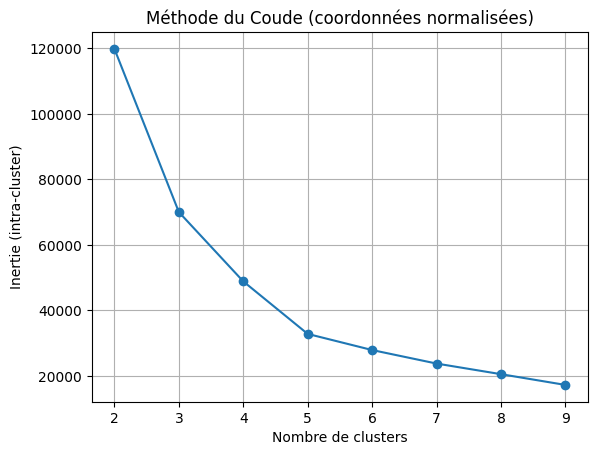

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Étape 1 : Sélection des coordonnées
coords = df_assurance[['LAT', 'LON']]

# Étape 2 : Normalisation des coordonnées
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(coords)

# Étape 3 : Méthode du coude (inertie)
inertias = []
for k in range(2, 10):
    model = KMeans(n_clusters=k, random_state=42, n_init=20)
    model.fit(coords_scaled)
    inertias.append(model.inertia_)

plt.figure()
plt.plot(range(2, 10), inertias, marker='o')
plt.xlabel('Nombre de clusters')
plt.ylabel('Inertie (intra-cluster)')
plt.title('Méthode du Coude (coordonnées normalisées)')
plt.grid(True)
plt.show()

Le nombre optimal de clusters a été fixé à k = 5 car c’est à ce niveau que la diminution de l’inertie commence à se stabiliser ce qui indique un bon compromis entre homogénéité des groupes et complexité du modèle.

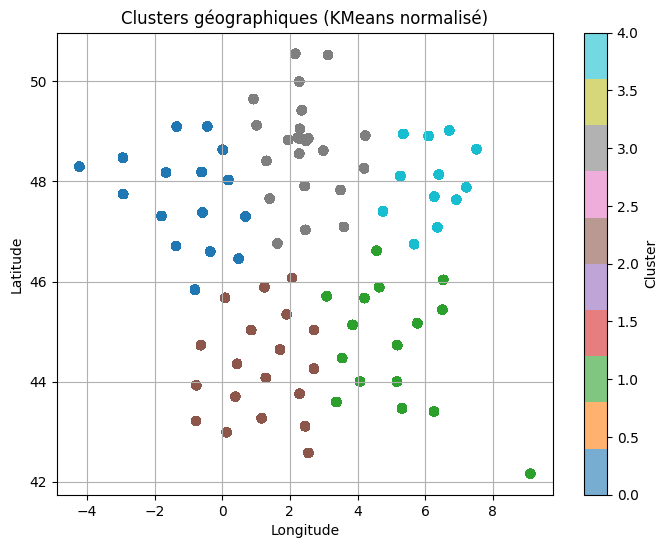

,has_claim
geo_cluster,
0,0.130309
1,0.133975
2,0.125219
3,0.153900
4,0.150028


In [ ]:
# Clustering final
kmeans_final = KMeans(n_clusters=5, random_state=42, n_init=20)
df_assurance['geo_cluster'] = kmeans_final.fit_predict(coords_scaled)

# Affichage sur une carte
plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    df_assurance['LON'], df_assurance['LAT'],
    c=df_assurance['geo_cluster'], cmap='tab10', alpha=0.6
)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Clusters géographiques (KMeans normalisé)")
plt.colorbar(scatter, label='Cluster')
plt.grid(True)
plt.show()

# Analyse de la sinistralité par cluster
df_assurance.groupby('geo_cluster')['has_claim'].mean()


In [ ]:
# Export de la base géographique finale
export_path = "/content/drive/MyDrive/Projet Data/df_assurance.csv"
df_assurance.to_csv(export_path, index=False)
print(" df_assurance exportée dans :", export_path)

 df_assurance exportée dans : /content/drive/MyDrive/Projet Data/df_assurance.csv


# **Analyses descriptives des données**

## Univariée

## Analyse univariée : Variables numériques

### ➤ Distribution de `vh_age`

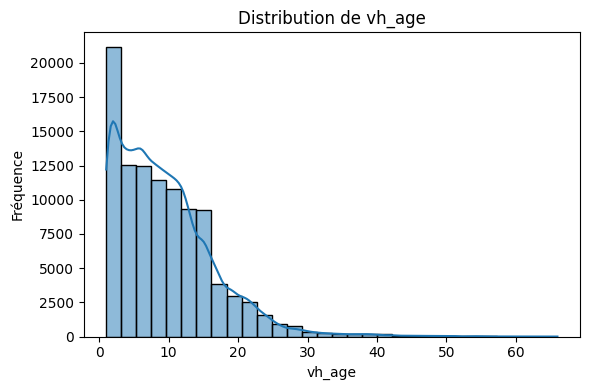

### ➤ Distribution de `vh_value`

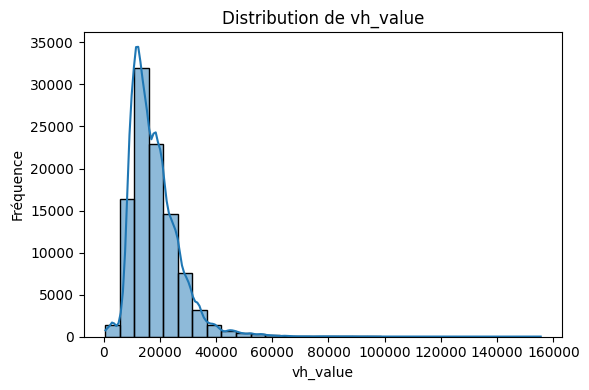

### ➤ Distribution de `vh_weight`

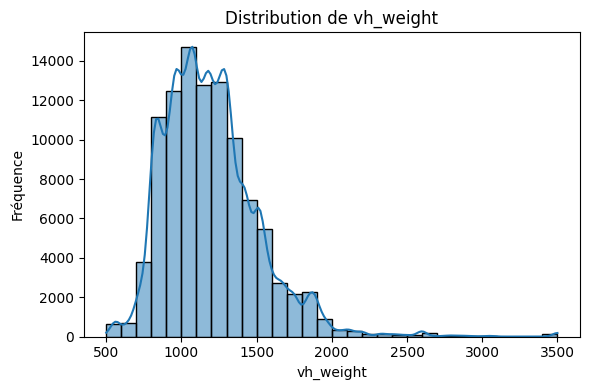

### ➤ Distribution de `pol_bonus`

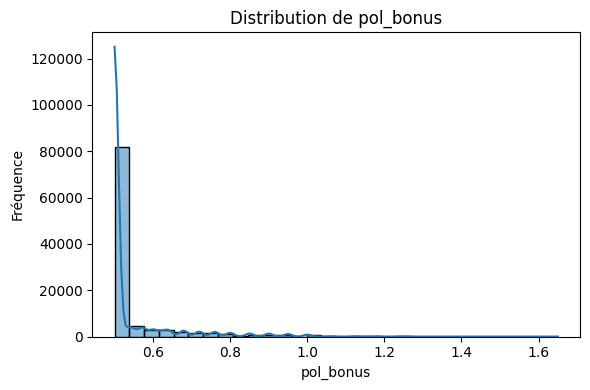

### ➤ Distribution de `pol_duration`

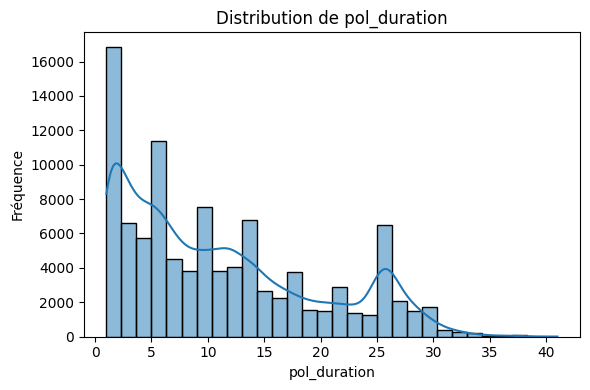

### ➤ Distribution de `pol_sit_duration`

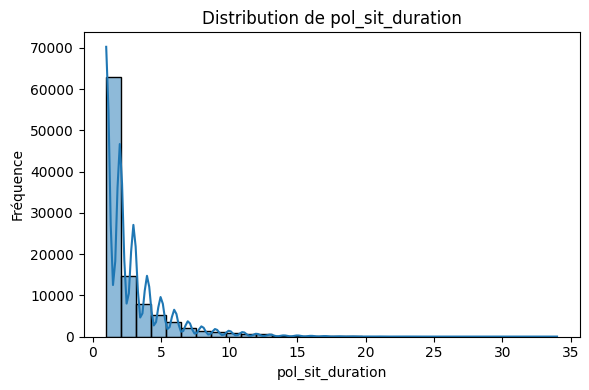

### ➤ Distribution de `drv_age1`

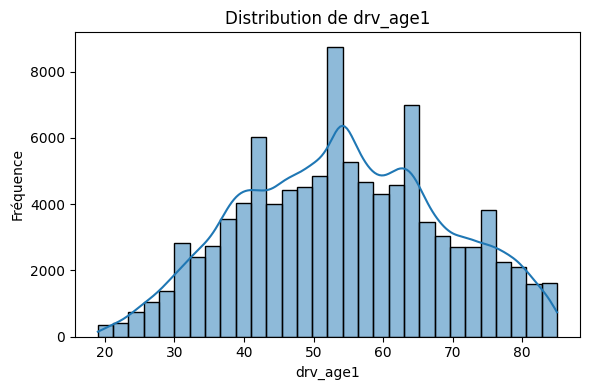

### ➤ Distribution de `drv_age_lic1`

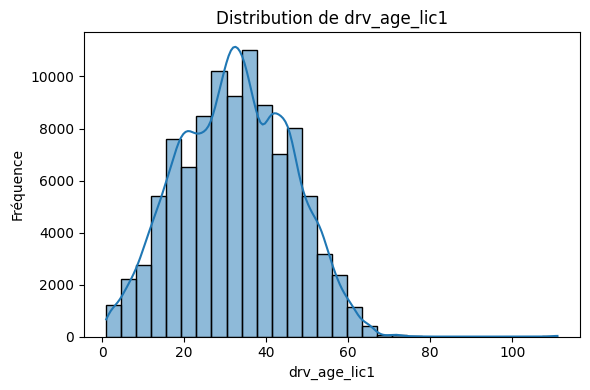

### ➤ Distribution de `claim_nb`

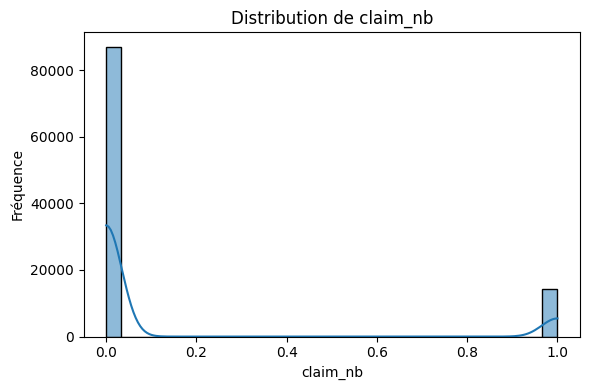

### ➤ Distribution de `claim_amount`

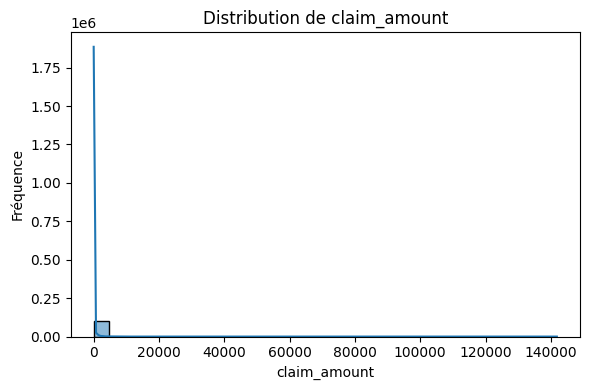

### ➤ Distribution de `temp_max_moy`

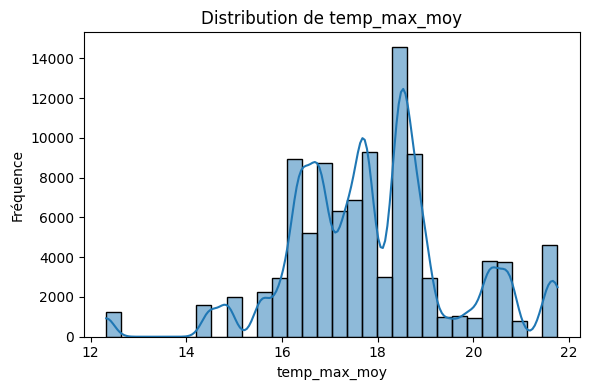

### ➤ Distribution de `temp_moyenne`

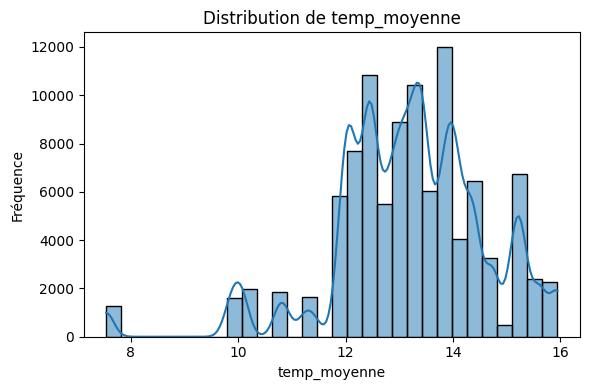

### ➤ Distribution de `precip_moy`

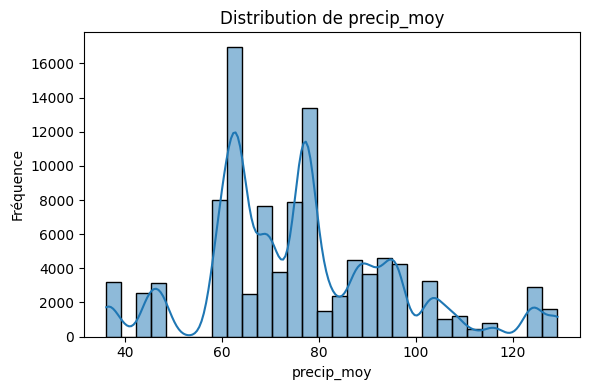

In [ ]:
import seaborn as sns
from IPython.display import display, Markdown

# On crée une copie du DataFrame pour éviter de modifier l'original
df = df_assurance.copy()

# Analyse univariée des variables numériques

# Affichage d'un titre Markdown dans l'output Jupyter
display(Markdown("## Analyse univariée : Variables numériques"))

# Liste des variables quantitatives à analyser
vars_quanti = [
    'vh_age', 'vh_value', 'vh_weight',
    'pol_bonus', 'pol_duration', 'pol_sit_duration',
    'drv_age1', 'drv_age_lic1',
    'claim_nb', 'claim_amount',
    'temp_max_moy', 'temp_moyenne', 'precip_moy'
]

for col in vars_quanti:
    display(Markdown(f"### ➤ Distribution de `{col}`"))
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col].dropna(), bins=30, kde=True)
    plt.title(f'Distribution de {col}')
    plt.xlabel(col)
    plt.ylabel("Fréquence")
    plt.tight_layout()
    plt.show()

L’analyse des variables quantitatives montre des résultats globalement cohérents avec les attentes du secteur.

- L’âge des véhicules (`vh_age`) et des conducteurs (`drv_age1`) est majoritairement compris entre 20 et 60 ans, ce qui correspond à une population active classique.
- La valeur des véhicules (`vh_value`) est très concentrée autour de valeurs basses, avec quelques cas de véhicules très chers. Cela reflète bien la structure d’un portefeuille d’assurance généraliste.
- Les variables liées aux sinistres (`claim_nb` et `claim_amount`) sont très asymétriques : la grande majorité des contrats n'ont connu aucun sinistre, ce qui est normal dans ce type de base. Quelques sinistres élevés créent une queue à droite dans la distribution.
- Les variables météo (`temp_max_moy`, `temp_moyenne`, `precip_moy`) présentent des valeurs réalistes et bien réparties, ce qui confirme que l’enrichissement climatique a été bien intégré.



## Analyse univariée : Variables qualitatives

### ➤ Répartition de `vh_fuel`

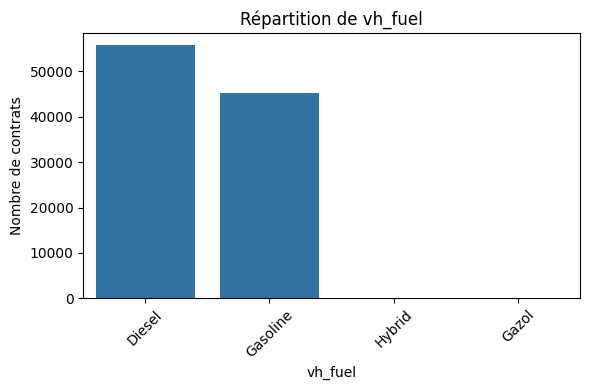

### ➤ Répartition de `pol_usage`

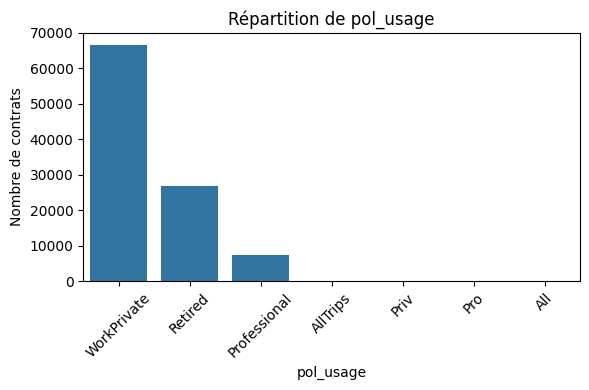

### ➤ Répartition de `pol_pay_freq`

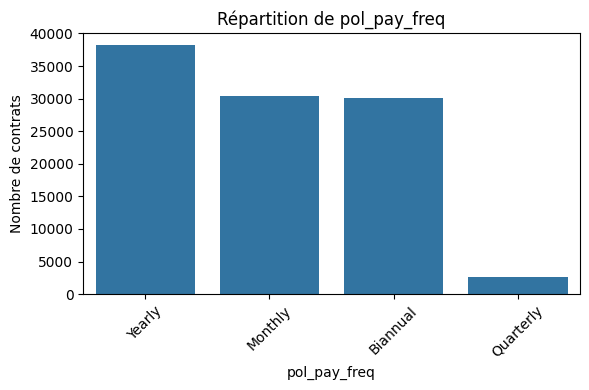

### ➤ Répartition de `pol_coverage`

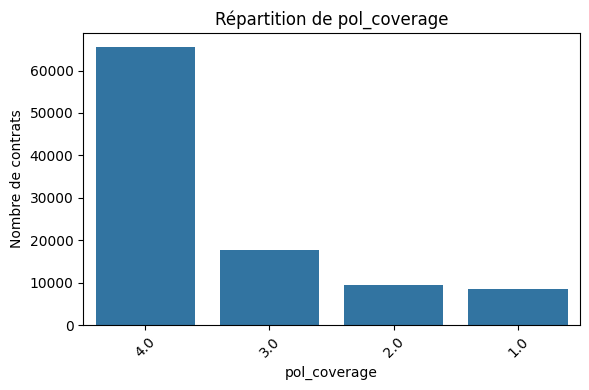

### ➤ Répartition de `vh_type`

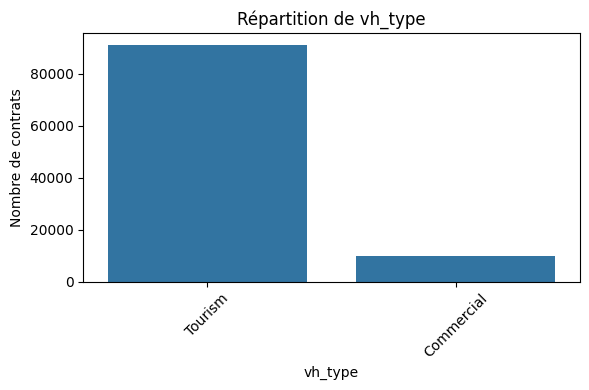

### ➤ Répartition de `drv_sex1`

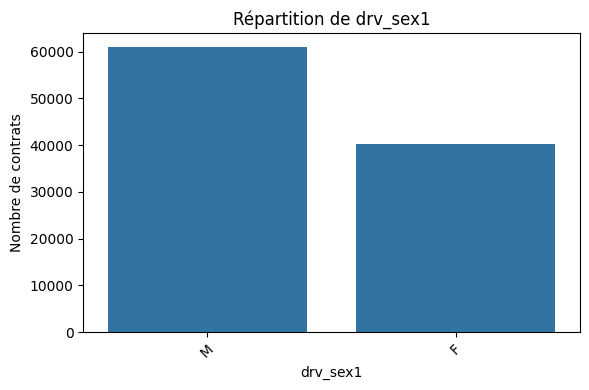

In [ ]:
# Analyse univariée des variables qualitatives
# Pour chaque variable catégorielle sélectionnée, on affiche un graphique (countplot)
# montrant la répartition des modalités (valeurs) dans l'ensemble des contrats.

display(Markdown("## Analyse univariée : Variables qualitatives"))

vars_quali = ['vh_fuel', 'pol_usage', 'pol_pay_freq', 'pol_coverage', 'vh_type', 'drv_sex1']

for col in vars_quali:
    display(Markdown(f"### ➤ Répartition de `{col}`"))
    plt.figure(figsize=(6, 4))
    order = df[col].value_counts().index
    sns.countplot(x=col, data=df, order=order)
    plt.title(f'Répartition de {col}')
    plt.xlabel(col)
    plt.ylabel("Nombre de contrats")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


## Multivariée

### ➤ Corrélations entre variables numériques (dont sinistres)

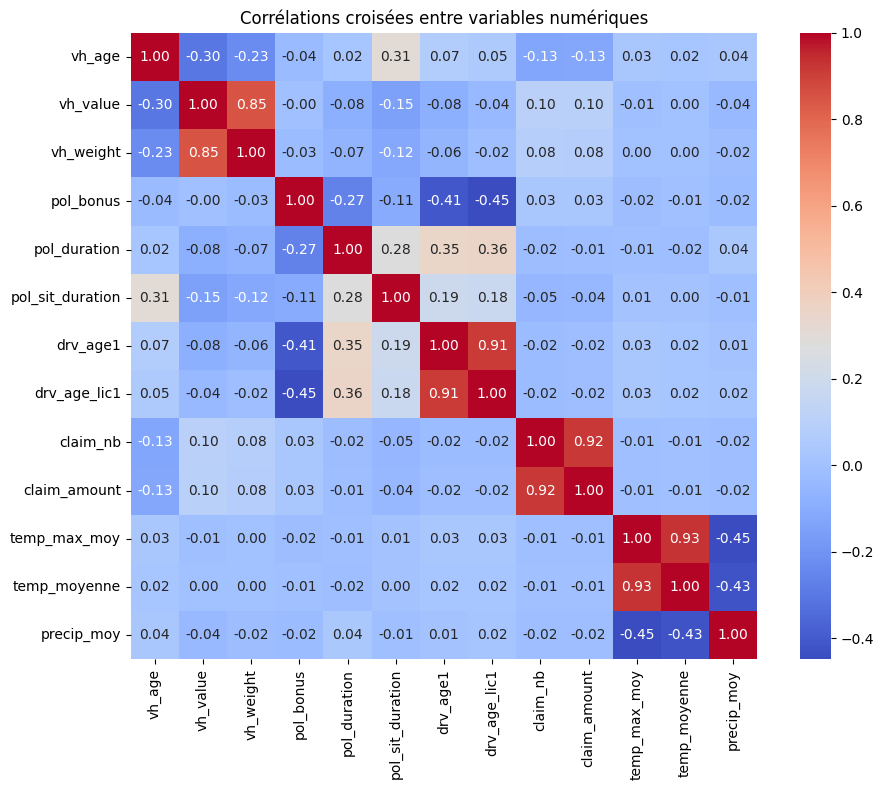

In [ ]:
# Analyse multivariée des corrélations entre les variables numériques sélectionnées
# Objectif : visualiser les liens (corrélations) entre les principales variables explicatives et les variables liées aux sinistres.

display(Markdown("### ➤ Corrélations entre variables numériques (dont sinistres)"))

vars_corr = [
    'vh_age', 'vh_value', 'vh_weight',
    'pol_bonus', 'pol_duration', 'pol_sit_duration',
    'drv_age1', 'drv_age_lic1',
    'claim_nb', 'claim_amount',
    'temp_max_moy', 'temp_moyenne', 'precip_moy'
]

plt.figure(figsize=(10, 8))
sns.heatmap(df[vars_corr].corr(method='spearman'), annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title("Corrélations croisées entre variables numériques")
plt.tight_layout()
plt.show()

### ➤ Répartition de `claim_amount` selon `vh_fuel`

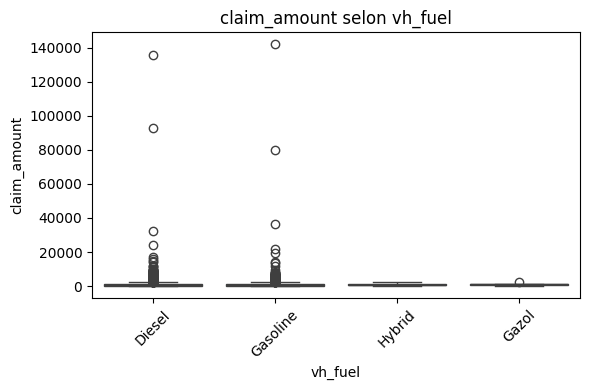

### ➤ Répartition de `claim_amount` selon `pol_usage`

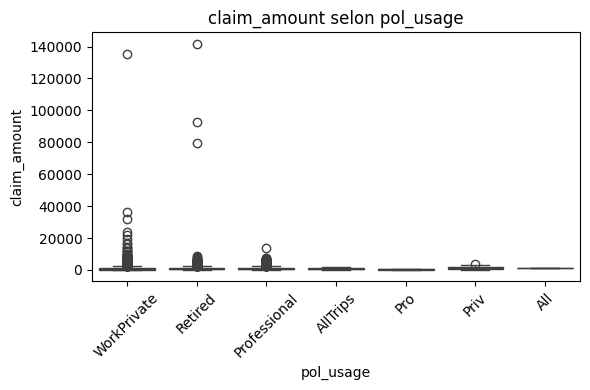

### ➤ Répartition de `claim_amount` selon `pol_coverage`

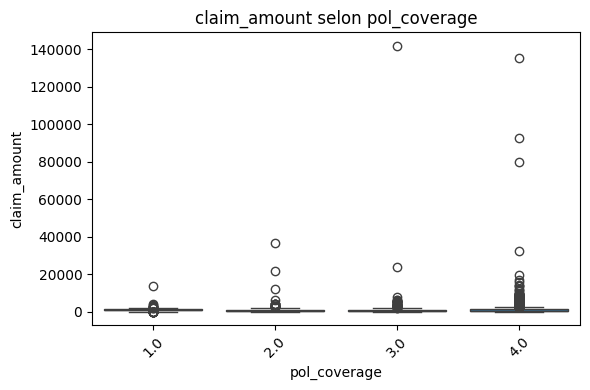

In [ ]:
# Analyse de la répartition des montants de sinistres selon différentes variables qualitatives
# Objectif : étudier comment le montant des sinistres (claim_amount) varie selon certaines caractéristiques du contrat ou du véhicule.
df_claims = df[df['claim_amount'] > 0]
boxplot_vars = ['vh_fuel', 'pol_usage', 'pol_coverage']

for col in boxplot_vars:
    display(Markdown(f"### ➤ Répartition de `claim_amount` selon `{col}`"))
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=col, y='claim_amount', data=df_claims)
    plt.title(f'claim_amount selon {col}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

### ➤ Taux moyen de sinistres selon `vh_fuel`

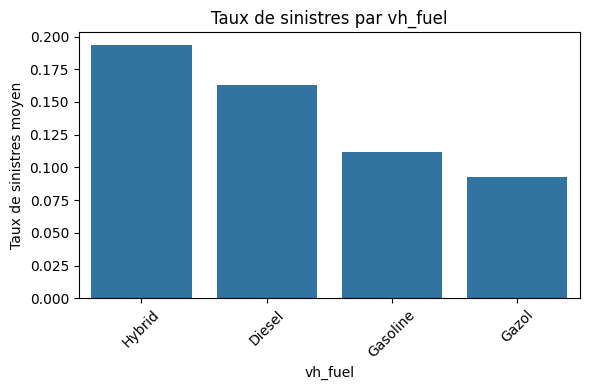

### ➤ Taux moyen de sinistres selon `pol_usage`

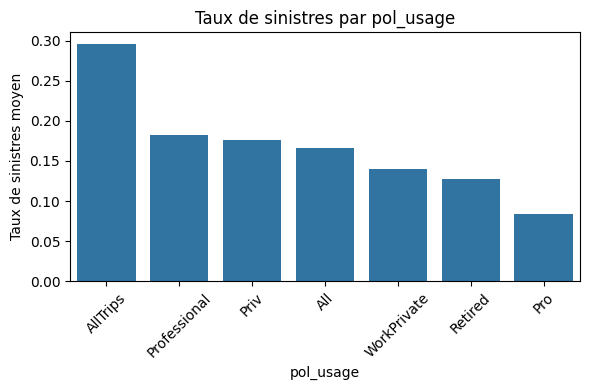

### ➤ Taux moyen de sinistres selon `pol_coverage`

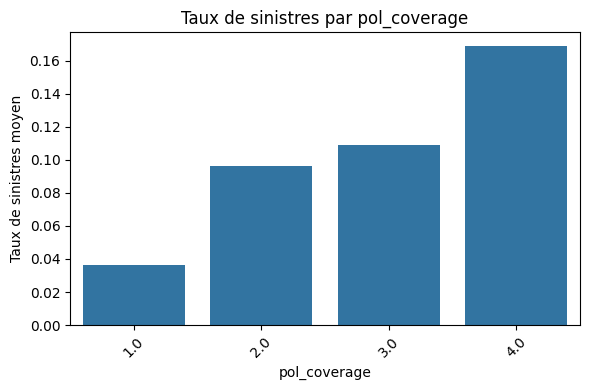

### ➤ Taux moyen de sinistres selon `drv_sex1`

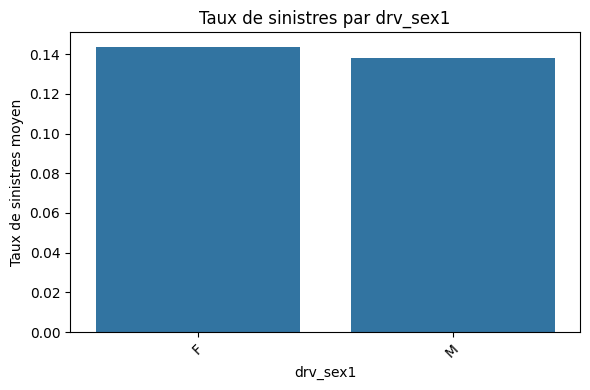

In [ ]:
# Analyse du taux moyen de sinistres selon différentes variables qualitatives
# Objectif : étudier comment le risque de survenue d'un sinistre varie en fonction de certaines caractéristiques du contrat ou du conducteur
rate_vars = ['vh_fuel', 'pol_usage', 'pol_coverage', 'drv_sex1']

for col in rate_vars:
    taux = df.groupby(col)['has_claim'].mean().sort_values(ascending=False)
    display(Markdown(f"### ➤ Taux moyen de sinistres selon `{col}`"))
    plt.figure(figsize=(6, 4))
    sns.barplot(x=taux.index, y=taux.values)
    plt.ylabel("Taux de sinistres moyen")
    plt.xlabel(col)
    plt.title(f"Taux de sinistres par {col}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

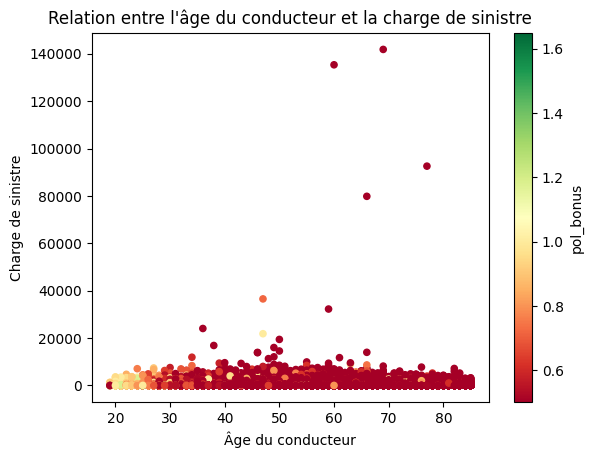

In [ ]:
df_assurance.plot.scatter(x='drv_age1', y='claim_amount', c='pol_bonus', cmap='RdYlGn')
plt.title('Relation entre l\'âge du conducteur et la charge de sinistre')
plt.xlabel('Âge du conducteur')
plt.ylabel('Charge de sinistre')
plt.show()

Le graphique montre que les conducteurs plus jeunes ont généralement des charges de sinistre faibles, tandis que certains conducteurs plus âgés présentent des charges élevées. Le bonus du conducteur semble également influencer la charge de sinistre, plus le bonus est faible moins la charge de sinistre est important et inversement.








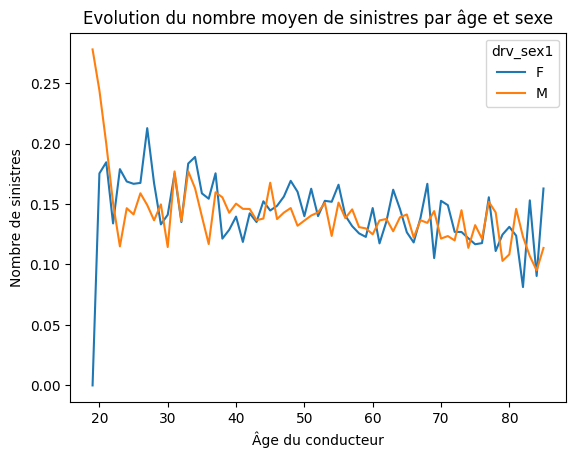

In [ ]:
# Tableau croisé pour afficher la moyenne du nombre de sinistres par âge et sexe
df_assurance.pivot_table(index='drv_age1', columns='drv_sex1', values='claim_nb', aggfunc='mean').plot()

# Ajout des labels aux axes
plt.title("Evolution du nombre moyen de sinistres par âge et sexe")
plt.xlabel('Âge du conducteur')
plt.ylabel('Nombre de sinistres')

# Affichage du graphique
plt.show()


Ce graphique montre l'évolution du nombre moyen de sinistres en fonction de l'âge du conducteur, séparé par sexe. En général, les hommes ont un nombre de sinistres plus élevé à un âge jeune, mais cette différence se réduit avec l'âge. Cela met en évidence l'impact de l'âge et du sexe sur la fréquence des sinistres, ce qui peut être utile pour cibler les offres d'assurances.

In [ ]:
import statsmodels.formula.api as smf

# ANALYSE MULTIVARIÉE – ÉCONOMÉTRIE
display(Markdown("## Analyse économétrique – Régression linéaire (OLS)"))

# On se concentre sur les contrats ayant eu au moins un sinistre (sinon claim_amount = 0)
df_reg = df_assurance[df_assurance['claim_amount'] > 0].copy()

# Modèle explicatif du montant des sinistres
# Variables explicatives : véhicule, conducteur, météo, type de contrat
formule = (
    "claim_amount ~ vh_age + vh_value + drv_age1 + "
    "C(drv_sex1) + "
    "C(vh_fuel) + C(pol_coverage) + C(geo_cluster)"
)



# Régression linéaire OLS avec statsmodels
modele = smf.ols(formula=formule, data=df_reg).fit()

# Résumé des résultats
display(Markdown("### Résumé du modèle de régression OLS"))
print(modele.summary())

## Analyse économétrique – Régression linéaire (OLS)

### Résumé du modèle de régression OLS

                            OLS Regression Results                            
Dep. Variable:           claim_amount   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     4.801
Date:                Wed, 30 Apr 2025   Prob (F-statistic):           6.55e-09
Time:                        21:39:30   Log-Likelihood:            -1.1363e+05
No. Observations:               12345   AIC:                         2.273e+05
Df Residuals:                   12330   BIC:                         2.274e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                811

### Résultats du modèle de régression linéaire (OLS)

Nous avons estimé un modèle OLS visant à expliquer le **montant des sinistres** (`claim_amount`) pour les contrats ayant déclaré au moins un sinistre.

#### Choix des variables explicatives

Le modèle final inclut :
- des caractéristiques du **véhicule** : `vh_age`, `vh_value`, `vh_fuel`
- des caractéristiques du **conducteur** : `drv_age1`, `drv_sex1`
- des éléments du **contrat** : `pol_coverage`
- des **clusters géographiques** (`geo_cluster`) créés à partir des coordonnées GPS (`LAT`, `LON`)

Les variables non significatives dans les modèles précédents (ancienneté de police, bonus, météo...) ont été retirées pour améliorer la lisibilité et la robustesse du modèle.

#### Interprétation des résultats

Plusieurs variables ressortent comme **statistiquement significatives** :
- Les véhicules plus anciens (`vh_age`) sont associés à des sinistres moins coûteux.
- Les véhicules plus chers (`vh_value`) engendrent des sinistres plus élevés.
- Les conducteurs plus âgés (`drv_age1`) sont associés à un coût de sinistre légèrement plus élevé.
- Le sexe du conducteur (`drv_sex1`) a un effet significatif : les conducteurs de sexe masculin déclarent des sinistres moins coûteux en moyenne.
- Certaines modalités de `pol_coverage` (notamment `2.0` et `3.0`) sont significativement associées à une réduction du montant des sinistres.
- Deux zones géographiques (`geo_cluster` 1 et 2) présentent un coût de sinistre significativement plus élevé, révélant un **effet régional** potentiel.

La variable `vh_fuel` montre également une différence significative pour la modalité "Essence" (`T.Gasoline`) par rapport à la catégorie de référence.

Bien que le **R² reste faible (0.005)**, cela est courant dans ce type de données où la distribution des montants de sinistres est fortement dispersée. L’objectif ici est avant tout d’**identifier des effets directionnels et significatifs**, ce que ce modèle permet.


Nous allons maintenant évaluer la stabilité du modèle via le **Variance Inflation Factor (VIF)** afin de détecter d’éventuelles redondances entre variables explicatives.


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

y, X = dmatrices(formule, data=df_reg, return_type='dataframe')

vif_data = pd.DataFrame()
vif_data["variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

display(Markdown("### ➤ Vérification de la multicolinéarité (VIF)"))
display(vif_data.sort_values("VIF", ascending=False))

### ➤ Vérification de la multicolinéarité (VIF)

,variable,VIF
0,Intercept,94.801490
7,C(pol_coverage)[T.4.0],10.759535
6,C(pol_coverage)[T.3.0],7.358929
5,C(pol_coverage)[T.2.0],4.286654
10,C(geo_cluster)[T.3],1.937755
8,C(geo_cluster)[T.1],1.675378
12,vh_age,1.661845
9,C(geo_cluster)[T.2],1.525522
11,C(geo_cluster)[T.4],1.456227
13,vh_value,1.248730


### Diagnostic de multicolinéarité (VIF)

L’analyse du Variance Inflation Factor (VIF) montre que la **multicolinéarité est bien maîtrisée** dans ce modèle :

- La majorité des variables ont des VIF très faibles (proches de 1) indiquant **peu ou pas de redondance**.
- Seule une modalité de `pol_coverage` atteint un VIF légèrement supérieur à 10, ce qui reste **acceptable dans un modèle bien spécifié** avec des variables catégorielles.

Le modèle est donc **stable**, **interprétable** et économétriquement robuste. Il peut servir de base à l’interprétation des effets et à la comparaison avec les modèles de type machine learning.


In [ ]:
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan

residuals = modele.resid
exog = modele.model.exog  # variables explicatives

bp_test = het_breuschpagan(residuals, exog)
labels = ['Statistique LM', 'p-value LM', 'Statistique F', 'p-value F']
print(dict(zip(labels, bp_test)))

{'Statistique LM': np.float64(16.01577308644249), 'p-value LM': np.float64(0.3124119791191689), 'Statistique F': np.float64(1.1440780436069073), 'p-value F': np.float64(0.3124904500193657)}


### Vérification de l'homoscédasticité : test de Breusch-Pagan

Nous avons appliqué un test de Breusch-Pagan afin de vérifier l’hypothèse d’homoscédasticité des résidus du modèle OLS. Les résultats obtenus sont les suivants :

- Statistique LM : 16.02  
- p-value LM : 0.31  
- Statistique F : 1.14  
- p-value F : 0.31

La p-value étant largement supérieure à 5%, nous ne rejetons pas l’hypothèse nulle. Il n’y a donc **pas d’hétéroscédasticité significative** détectée dans le modèle, ce qui valide l’hypothèse de variance constante des erreurs.


In [ ]:
df_assurance['has_claim'].value_counts(normalize=True)

,proportion
has_claim,
0,0.859722
1,0.140278


In [ ]:
formule_logit = (
    "has_claim ~ vh_age + vh_value + drv_age1 + C(drv_sex1) + "
    "C(vh_fuel) + C(pol_coverage) + C(geo_cluster)"
)

modele_logit = smf.logit(formula=formule_logit, data=df_assurance).fit()
print(modele_logit.summary())

Optimization terminated successfully.
         Current function value: 0.390920
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:              has_claim   No. Observations:               101149
Model:                          Logit   Df Residuals:                   101134
Method:                           MLE   Df Model:                           14
Date:                Wed, 30 Apr 2025   Pseudo R-squ.:                 0.03588
Time:                        21:39:35   Log-Likelihood:                -39541.
converged:                       True   LL-Null:                       -41013.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -2.4834      0.081    -30.522      0.000      -2.643      

### Résultats du modèle logit – sinistralité

Ce modèle logit vise à expliquer la **probabilité d’avoir un sinistre** (`has_claim = 1`) en fonction des caractéristiques du véhicule, du conducteur, du contrat, et de la zone géographique.

#### Variables significatives

- **Sexe du conducteur (`drv_sex1`)** : les hommes ont une probabilité de sinistre significativement plus faible que les femmes (modalité de référence).
- **Type de carburant (`vh_fuel`)** : les véhicules essence ont une sinistralité plus faible que la catégorie de référence.
- **Couverture (`pol_coverage`)** : plus la couverture est élevée, plus la probabilité de sinistre augmente, ce qui peut refléter un effet de sélection (les conducteurs à risque choisissent plus de garanties).
- **Zone géographique (`geo_cluster`)** : certaines zones (clusters 1 et 3) présentent une sinistralité significativement plus élevée.
- **Âge du véhicule (`vh_age`)** : plus le véhicule est ancien, moins il est sinistré.
- **Valeur du véhicule (`vh_value`)** : plus le véhicule est cher, plus la probabilité de sinistre augmente.
- **Âge du conducteur (`drv_age1`)** : les conducteurs plus âgés ont une sinistralité plus faible.


Le modèle est globalement significatif avec un **pseudo R² de 0.03584**, et permet d’identifier les principaux facteurs influençant la survenue d’un sinistre. Il complète le modèle OLS (portant sur le montant des sinistres) et permet une **modélisation cohérente du risque assuré**.


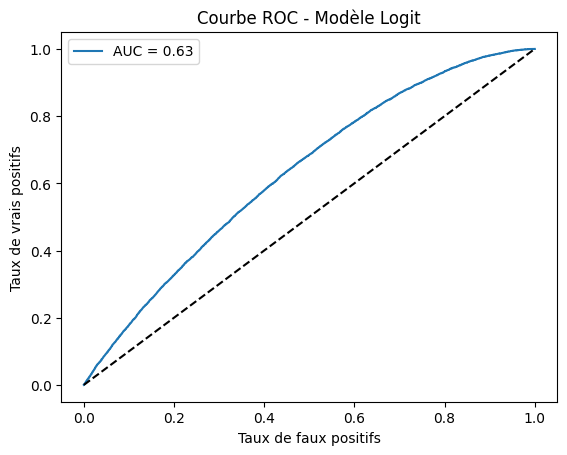

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Prédictions de probabilité
y_true = df_assurance['has_claim']
y_pred_prob = modele_logit.predict(df_assurance)

# Calcul de la courbe ROC et de l'AUC
fpr, tpr, _ = roc_curve(y_true, y_pred_prob)
auc = roc_auc_score(y_true, y_pred_prob)

# Affichage
plt.plot(fpr, tpr, label=f"AUC = {auc:.2f}")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("Taux de faux positifs")
plt.ylabel("Taux de vrais positifs")
plt.title("Courbe ROC - Modèle Logit")
plt.legend()
plt.show()


Le modèle obtient une AUC de **0.63**, ce qui indique une **capacité modérée à distinguer les contrats avec sinistre des contrats sans sinistre**. Bien que ce score soit perfectible, il montre que le modèle capte partiellement la logique de survenance des sinistres.

## Analyse en Composante Principales

In [ ]:
from sklearn.decomposition import PCA

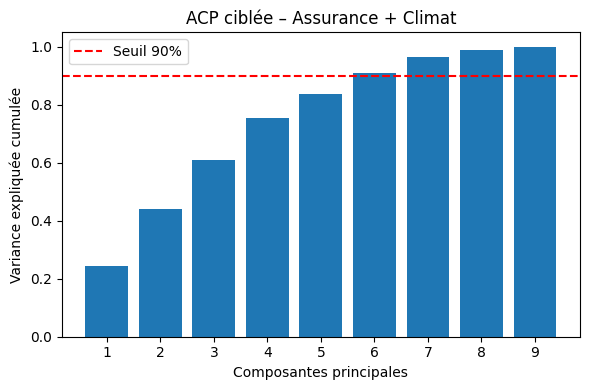

In [ ]:
# 1. Sélection manuelle des variables pertinentes
variables_importantes = [
    'pol_bonus', 'drv_age1', 'drv_age_lic1',
    'vh_value', 'vh_cyl',
    'claim_amount', 'claim_nb',
    'temp_moyenne', 'precip_moy'

]

# 2. Création d’un DataFrame propre
df_acp = df_assurance[variables_importantes].dropna()

# 3. Centrage-réduction
scaler = StandardScaler()
df_acp_cr = scaler.fit_transform(df_acp)

# 4. Application de l’ACP
acp = PCA()
coord = acp.fit_transform(df_acp_cr)

# 5. Visualisation de la variance expliquée cumulée
plt.figure(figsize=(6, 4))
plt.bar(np.arange(1, len(acp.explained_variance_ratio_)+1),
        np.cumsum(acp.explained_variance_ratio_),
        tick_label=np.arange(1, len(acp.explained_variance_ratio_)+1))
plt.axhline(y=0.9, color='red', linestyle='--', label='Seuil 90%')
plt.xlabel("Composantes principales")
plt.ylabel("Variance expliquée cumulée")
plt.title("ACP ciblée – Assurance + Climat")
plt.legend()
plt.tight_layout()
plt.show()

Les variables retenues pour l’ACP ont été choisies en fonction des objectifs du projet : analyser l’impact combiné des profils clients, des caractéristiques des véhicules, des conditions climatiques et de la sinistralité. Le bonus, l’âge du conducteur et l’ancienneté du permis permettent de qualifier le profil de conduite. La valeur et la cylindrée du véhicule renseignent sur le potentiel de risque technique ou financier. Enfin, les variables climatiques (température moyenne, précipitations) et les données de sinistralité (montant et fréquence des sinistres) permettent de relier le contexte environnemental au niveau de risque observé. Cette sélection vise une ACP ciblée, à la fois pertinente sur le plan métier et plus facilement interprétable.

L’ACP appliquée aux variables assurantielles et climatiques montre une dispersion modérée de l’information : il faut six composantes principales pour expliquer 90 % de la variance totale. Cela reflète la diversité des dimensions présentes dans la base. Les trois premières composantes permettent néanmoins une interprétation claire en lien avec le profil du conducteur, les caractéristiques du véhicule et l’environnement climatique.

In [ ]:
colonnes_acp = [col for col in df_acp.columns if col != "has_claim"]

# Affichage des contributions des variables (loadings)
loadings = pd.DataFrame(acp.components_,
                        columns=colonnes_acp,
                        index=[f'PC{i+1}' for i in range(len(acp.components_))])
display(loadings.T)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
pol_bonus,-0.426555,-0.118247,0.033342,0.030585,0.891619,-0.076641,0.005356,0.001983,0.033621
drv_age1,0.629949,0.043822,-0.006436,0.038632,0.331558,-0.011992,-0.018467,-0.001655,-0.699494
drv_age_lic1,0.634195,0.078014,-0.015533,0.028298,0.285568,-0.010644,-0.005585,0.003700,0.713415
vh_value,-0.088593,0.685420,-0.064743,-0.113870,0.053375,-0.007910,-0.015506,0.708310,-0.018368
vh_cyl,-0.084492,0.678244,-0.080246,-0.156015,0.055538,-0.048834,0.037248,-0.703579,-0.013635
claim_amount,-0.021678,0.114018,0.007152,0.700633,-0.079666,-0.699446,-0.004272,-0.001641,0.000596
claim_nb,-0.053659,0.155344,0.001072,0.683958,0.032192,0.708389,0.025739,-0.040890,0.001704
temp_moyenne,0.025766,0.061933,0.703750,-0.025439,-0.010086,-0.012203,0.706357,0.019509,-0.004062
precip_moy,0.003289,-0.085015,-0.701896,0.011490,0.010847,-0.015263,0.705939,0.034612,-0.008588


### Composante principale 1 (PC1) – Profil de risque du conducteur

Cette première composante est principalement corrélée positivement avec l'âge du conducteur (`drv_age1`) et l'ancienneté du permis (`drv_age_lic1`), et négativement avec le bonus (`pol_bonus`). Elle distingue ainsi :
- D’un côté, les conducteurs expérimentés, plus âgés, avec un bon historique de conduite,
- De l’autre, des profils plus jeunes ou moins expérimentés, associés à un niveau de risque plus élevé.

Cette composante reflète donc un axe de maturité du conducteur, directement exploitable dans une logique de segmentation tarifaire.

### Composante principale 2 (PC2) – Caractéristiques économiques du véhicule

La deuxième composante est fortement influencée par la valeur (`vh_value`) et la cylindrée (`vh_cyl`) du véhicule. Elle reflète une dimension économique du contrat, liée aux caractéristiques techniques et financières du véhicule assuré.

Les valeurs élevées sur PC2 correspondent à des véhicules plus puissants, plus chers à réparer ou à remplacer, ce qui constitue un facteur de risque matériel important dans la tarification assurantielle.

### Composante principale 3 (PC3) – Environnement climatique

La troisième composante oppose les températures moyennes (`temp_moyenne`) aux précipitations moyennes (`precip_moy`). Elle reflète un axe climatique, différenciant :
- Les zones chaudes et sèches (valeurs positives sur PC3),
- Des régions plus humides ou tempérées (valeurs négatives).

Cette dimension environnementale peut jouer un rôle indirect dans le niveau de sinistralité, en influençant les conditions de circulation ou les comportements de conduite.


##Classification non supervisée : clustering



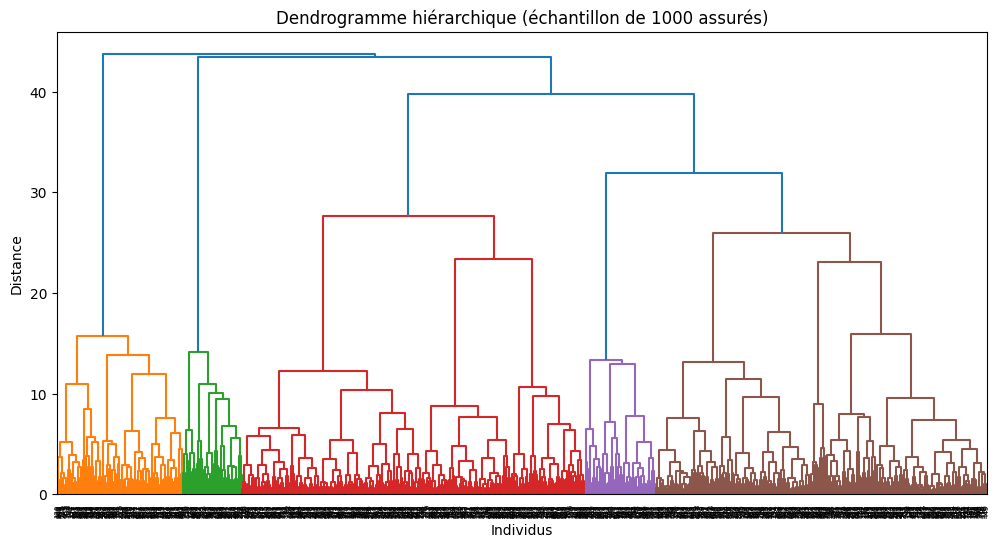

In [ ]:
import scipy.cluster.hierarchy as sch

# Liste des variables métier à utiliser (identique à ACP sans claim_amount)
variables_clustering = [
    'pol_bonus', 'drv_age1', 'drv_age_lic1',
    'vh_value', 'vh_cyl',
    'claim_nb',
    'temp_moyenne', 'precip_moy'
]

# 1. Création d’un sous-ensemble propre sur ces variables
df_cluster = df_assurance[variables_clustering].dropna()

# 2. Échantillonnage aléatoire de 1000 lignes
np.random.seed(42)
sample_df = df_cluster.sample(n=1000, random_state=42)

# 3. Standardisation (centrage-réduction)
scaler = StandardScaler()
sample_scaled = scaler.fit_transform(sample_df)

# 4. Clustering hiérarchique
Z = sch.linkage(sample_scaled, method='ward')

# 5. Affichage du dendrogramme
plt.figure(figsize=(12, 6))
sch.dendrogram(Z)
plt.title("Dendrogramme hiérarchique (échantillon de 1000 assurés)")
plt.xlabel("Individus")
plt.ylabel("Distance")
plt.show()


Le dendrogramme montre une coupure naturelle autour de 5 clusters avec un saut marqué dans les distances de fusion. Ce choix permet de segmenter les assurés en groupes distincts tout en restant interprétable d’un point de vue métier (âge, sinistralité, véhicule, météo).

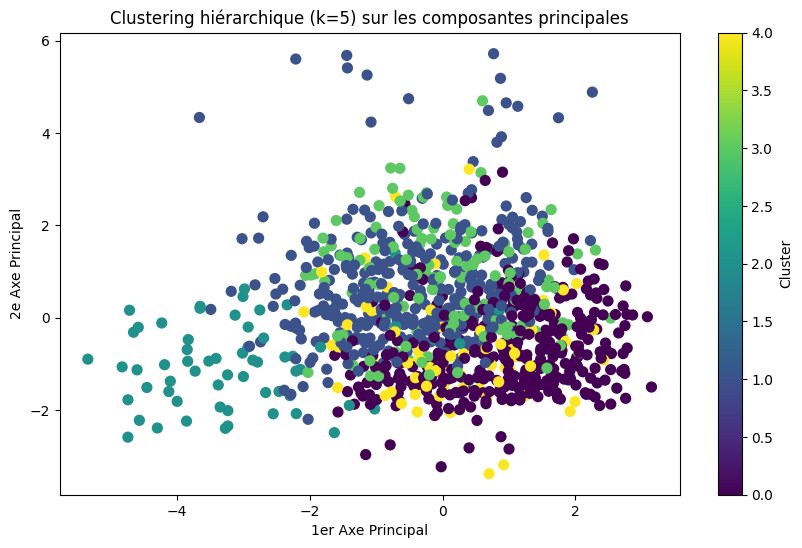

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# 6. Détermination du nombre de clusters (ex. 5 d'après le dendrogramme)
n_clusters = 5  # ajuste selon le saut observé

# 7. Application du clustering hiérarchique
clustering_model = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
sample_df['Cluster'] = clustering_model.fit_predict(sample_scaled)

# Ajouter les résultats dans la base complète
df_assurance.loc[sample_df.index, 'Cluster'] = sample_df['Cluster']

# 8. Réduction de dimension avec ACP pour visualisation
pca = PCA(n_components=2)
sample_pca = pca.fit_transform(sample_scaled)

# 9. Visualisation des clusters dans l’espace ACP
plt.figure(figsize=(10, 6))
plt.scatter(sample_pca[:, 0], sample_pca[:, 1], c=sample_df['Cluster'], cmap='viridis', s=50)
plt.title(f'Clustering hiérarchique (k={n_clusters}) sur les composantes principales')
plt.xlabel('1er Axe Principal')
plt.ylabel('2e Axe Principal')
plt.colorbar(label='Cluster')
plt.show()

In [ ]:
# Variables d’analyse
variables_clustering = [
    'pol_bonus', 'drv_age1', 'drv_age_lic1',
    'vh_value', 'vh_cyl', 'claim_nb',
    'temp_moyenne', 'precip_moy'
]

# Moyennes par cluster
sample_df.groupby('Cluster')[variables_clustering].mean().round(2)


,pol_bonus,drv_age1,drv_age_lic1,vh_value,vh_cyl,claim_nb,temp_moyenne,precip_moy
Cluster,,,,,,,,
0,0.51,61.38,39.06,13497.83,1394.99,0.00,13.78,68.33
1,0.53,48.44,27.51,22150.98,1890.87,0.00,13.19,74.56
2,0.86,36.12,14.56,14520.30,1466.02,0.12,12.82,82.26
3,0.52,55.33,33.39,19810.02,1740.07,1.00,13.04,76.74
4,0.50,56.70,35.33,15684.37,1548.92,0.00,10.64,108.21


Text(0.5, 1.0, 'Âge du conducteur par cluster')

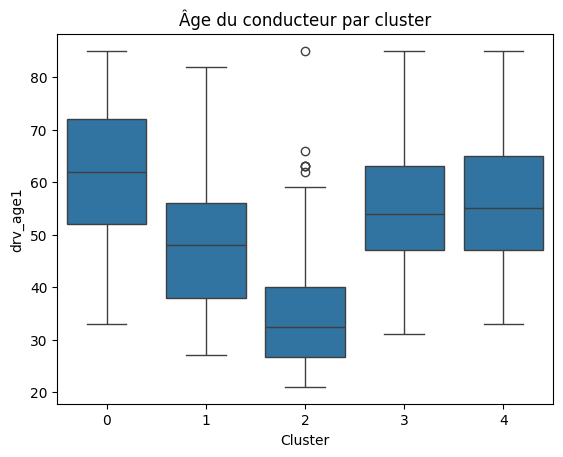

In [ ]:
sns.boxplot(x='Cluster', y='drv_age1', data=sample_df)
plt.title("Âge du conducteur par cluster")

### Analyse des clusters

**Cluster 0**  
Profils seniors prudents : âge moyen élevé (61 ans), forte ancienneté de permis, aucun sinistre, véhicules modestes, climat tempéré.

**Cluster 1**  
Conducteurs matures avec véhicules haut de gamme : 48 ans en moyenne, aucun sinistre, véhicules les plus chers et puissants, climat modérément humide.

**Cluster 2**  
Jeunes conducteurs à risque : 36 ans, faible ancienneté de permis, bonus élevé (malus probable), quelques sinistres.

**Cluster 3**  
Profils sinistrés : 55 ans, sinistralité forte (1 sinistre en moyenne), véhicules puissants, climat humide.

**Cluster 4**  
Profils météo spécifiques : âge similaire à cluster 3, aucun sinistre, climat plus froid et très pluvieux, potentiellement lié à des zones géographiques particulières.


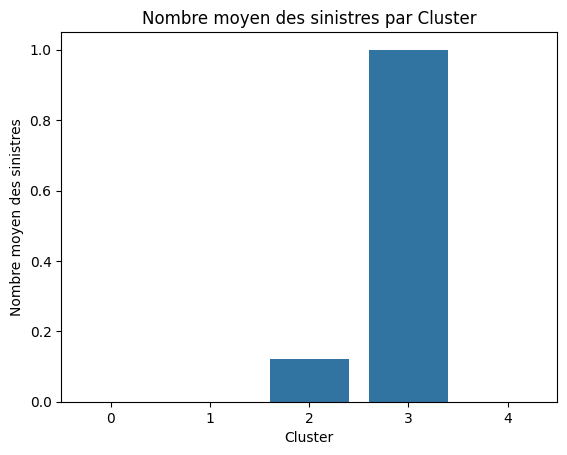

In [ ]:
# Ajout de la variable cible au DataFrame pour l'analyse
sample_df['claim_nb'] = df_assurance.loc[sample_df.index, 'claim_nb']

# Calcul de la moyenne de claim_amount par cluster (variable cible non utilisée dans le clustering)
claim_by_cluster = sample_df.groupby('Cluster')['claim_nb'].mean().round(2)

# Visualisation
sns.barplot(x=claim_by_cluster.index, y=claim_by_cluster.values)
plt.title('Nombre moyen des sinistres par Cluster')
plt.xlabel('Cluster')
plt.ylabel('Nombre moyen des sinistres')
plt.show()

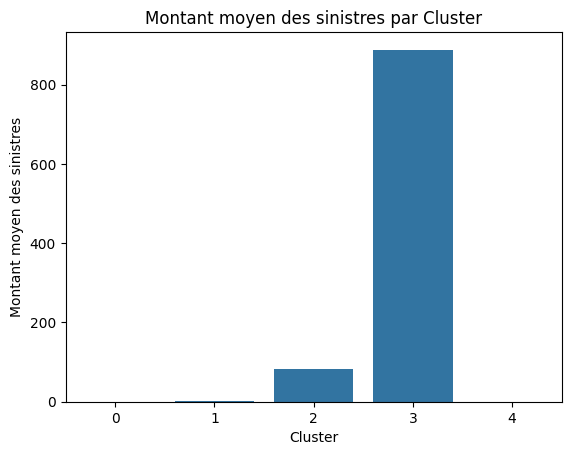

In [ ]:
# Ajout de la variable cible au DataFrame pour l'analyse
sample_df['claim_amount'] = df_assurance.loc[sample_df.index, 'claim_amount']

# Calcul de la moyenne de claim_amount par cluster (variable cible non utilisée dans le clustering)
claim_by_cluster = sample_df.groupby('Cluster')['claim_amount'].mean().round(2)

# Visualisation
sns.barplot(x=claim_by_cluster.index, y=claim_by_cluster.values)
plt.title('Montant moyen des sinistres par Cluster')
plt.xlabel('Cluster')
plt.ylabel('Montant moyen des sinistres')
plt.show()

Le graphique met en évidence une forte hétérogénéité de la sinistralité entre les clusters. Le **Cluster 3** présente un montant moyen de sinistres très élevé ce qui en fait un **segment à risque important**. À l'inverse, les **Clusters 0, 1 et 4** affichent des montants moyens quasi nuls suggérant des profils peu sinistrés. Le **Cluster 2** se situe dans une zone intermédiaire avec une sinistralité modérée.

Cette segmentation permet d'envisager des **actions ciblées** : ajustement de la tarification, mesures de prévention, ou stratégie commerciale différenciée selon les profils de risque.

In [ ]:
df_assurance.head()

,id_client,id_vehicle,id_policy,pol_bonus,pol_coverage,pol_duration,pol_sit_duration,pol_pay_freq,pol_payd,pol_usage,...,has_claim,DEP,temp_max_moy,temp_min_moy,temp_moyenne,precip_moy,LAT,LON,geo_cluster,Cluster
0,A00072644,V01,A00072644-V01,0.50,4.0,8.0,4.0,Monthly,No,WorkPrivate,...,1,71,18.434167,7.829583,13.131250,74.627917,46.616975,4.563550,1,NaN
1,A00036953,V01,A00036953-V01,0.50,4.0,11.0,1.0,Yearly,No,Retired,...,0,67,16.566667,7.609804,12.082353,76.372059,48.642510,7.515628,4,NaN
2,A00079066,V01,A00079066-V01,0.50,4.0,7.0,1.0,Yearly,No,Retired,...,0,69,18.421759,8.544907,13.482407,63.654630,45.888759,4.641306,1,NaN
3,A00018024,V01,A00018024-V01,0.64,3.0,5.0,1.0,Yearly,No,WorkPrivate,...,0,69,18.421759,8.544907,13.482407,63.654630,45.888759,4.641306,1,NaN
4,A00019276,V01,A00019276-V01,0.72,1.0,1.0,1.0,Monthly,No,WorkPrivate,...,0,19,17.624561,6.974123,12.301316,126.135088,45.346772,1.907281,2,NaN


In [ ]:
# Export de la base géographique finale
export_path = "/content/drive/MyDrive/Projet Data/df_assurance.csv"
df_assurance.to_csv(export_path, index=False)
print(" df_assurance exportée dans :", export_path)

 df_assurance exportée dans : /content/drive/MyDrive/Projet Data/df_assurance.csv


### Suite du projet

La partie suivante du projet s'appuiera sur des méthodes de Machine Learning. Celles-ci permettront :
- d’exploiter l'ensemble de la base d’assurés,
- de généraliser le clustering à tous les individus,
- de tester des modèles prédictifs non paramétriques (Random Forest, XGBoost, etc.) plus adaptés à la complexité et à la non-linéarité des données d’assurance.

L’objectif sera de mieux capter les comportements sinistrants et d’envisager des stratégies de segmentation ou de tarification plus robustes.
